# Portofolio Intermediate_Devi Aulia Oktaviona

# Data Preparation
a. Load dataset
b. Cek missing values, duplikasi, outlier
c. Cleaning data

In [1]:
# import library pandas
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt 
import numpy as np 

# Baca dataset dari file
df_sales = pd.read_csv('SalesTransactionv4a-230918-164139.csv')

# Konversi kolom 'Date' menjadi tipe data datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'])

# Temukan tanggal awal dan tanggal akhir
tanggal_awal = df_sales['Date'].min()
tanggal_akhir = df_sales['Date'].max()

# Cetak hasilnya
print(f"Rentang waktu data dalam dataset: dari {tanggal_awal} hingga {tanggal_akhir}")

# Tampilkan hasil
df_sales


Rentang waktu data dalam dataset: dari 2018-12-01 00:00:00 hingga 2019-12-09 00:00:00


,TransactionNo,Date,ProductNo,ProductName,Price,Quantity,CustomerNo,Country
0,581482,2019-12-09,22485,Set Of 2 Wooden Market Crates,21.47,12,17490.0,United Kingdom
1,581475,2019-12-09,22596,Christmas Star Wish List Chalkboard,10.65,36,13069.0,United Kingdom
2,581475,2019-12-09,23235,Storage Tin Vintage Leaf,11.53,12,13069.0,United Kingdom
3,581475,2019-12-09,23272,Tree T-Light Holder Willie Winkie,10.65,12,13069.0,United Kingdom
4,581475,2019-12-09,23239,Set Of 4 Knick Knack Tins Poppies,11.94,6,13069.0,United Kingdom
...,...,...,...,...,...,...,...,...
536345,C536548,2018-12-01,22168,Organiser Wood Antique White,18.96,-2,12472.0,Germany
536346,C536548,2018-12-01,21218,Red Spotty Biscuit Tin,14.09,-3,12472.0,Germany
536347,C536548,2018-12-01,20957,Porcelain Hanging Bell Small,11.74,-1,12472.0,Germany
536348,C536548,2018-12-01,22580,Advent Calendar Gingham Sack,16.35,-4,12472.0,Germany


# Data Cleansing
Eksekusi 2 code dibawah ini

In [3]:
# 1. Ubah kolom Date menjadi tipe datetime
df_sales['Date']= pd.to_datetime(df_sales['Date'])

# 2. Buang semua transaksi yang memiliki quantity negative atau yang TransactionNo diawali dengan C
df_sales = df_sales[df_sales['TransactionNo'].str[0]!='C']

# Tampilkan hasil
df_sales

,TransactionNo,Date,ProductNo,ProductName,Price,Quantity,CustomerNo,Country
0,581482,2019-12-09,22485,Set Of 2 Wooden Market Crates,21.47,12,17490.0,United Kingdom
1,581475,2019-12-09,22596,Christmas Star Wish List Chalkboard,10.65,36,13069.0,United Kingdom
2,581475,2019-12-09,23235,Storage Tin Vintage Leaf,11.53,12,13069.0,United Kingdom
3,581475,2019-12-09,23272,Tree T-Light Holder Willie Winkie,10.65,12,13069.0,United Kingdom
4,581475,2019-12-09,23239,Set Of 4 Knick Knack Tins Poppies,11.94,6,13069.0,United Kingdom
...,...,...,...,...,...,...,...,...
536320,536585,2018-12-01,37449,Ceramic Cake Stand + Hanging Cakes,20.45,2,17460.0,United Kingdom
536321,536590,2018-12-01,22776,Sweetheart 3 Tier Cake Stand,20.45,1,13065.0,United Kingdom
536322,536590,2018-12-01,22622,Box Of Vintage Alphabet Blocks,20.45,2,13065.0,United Kingdom
536323,536591,2018-12-01,37449,Ceramic Cake Stand + Hanging Cakes,20.45,1,14606.0,United Kingdom


In [5]:
# Deal Null Values
# Melihat jumlah nilai null dalam Dataset
df_sales.isnull().sum()

TransactionNo    0
Date             0
ProductNo        0
ProductName      0
Price            0
Quantity         0
CustomerNo       1
Country          0
dtype: int64

In [7]:
# How to Deal With Null Values
# Mengisi nilai null pada kolom numerik dengan 0
df_sales = df_sales.fillna({col: 0 for col in df_sales.select_dtypes(include=['int64', 'float64']).columns})

# Mengisi nilai null pada kolom kategorikal dengan 'unknown'
df_sales = df_sales.fillna({col: 'unknown' for col in df_sales.select_dtypes(include='object').columns})

# Menampilkan jumlah null value pada setiap kolom
df_sales.isnull().sum()

TransactionNo    0
Date             0
ProductNo        0
ProductName      0
Price            0
Quantity         0
CustomerNo       0
Country          0
dtype: int64

# Monthly Sales Trend

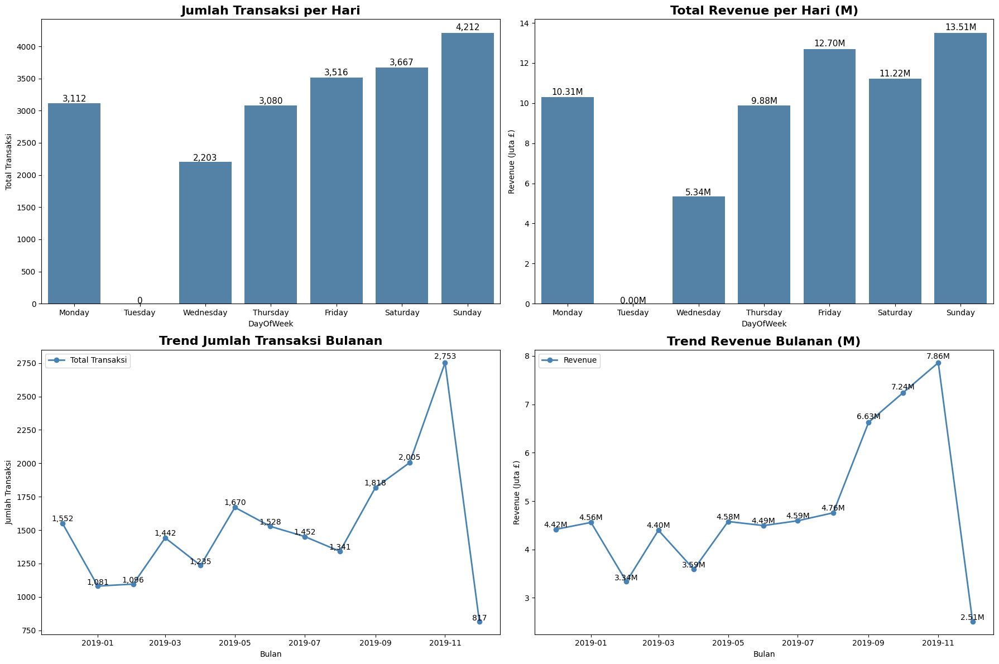

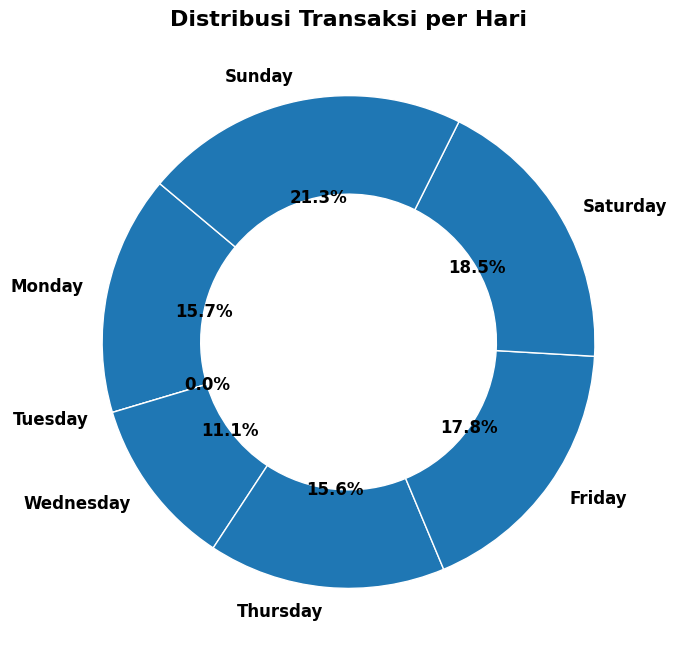

In [9]:
# 1. Persiapan Data
df_sales['Date'] = pd.to_datetime(df_sales['Date'])
df_sales['Revenue'] = df_sales['Quantity'] * df_sales['Price']

df_sales['DayOfWeek'] = pd.Categorical(
    df_sales['Date'].dt.day_name(),
    categories=['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday'],
    ordered=True
)

# Summary per Hari
summary_per_day = df_sales.groupby('DayOfWeek', observed=False).agg({
    'TransactionNo':'nunique',
    'CustomerNo':'nunique',
    'ProductNo':'nunique',
    'Revenue':'sum'
}).rename(columns={
    'TransactionNo':'Total Transaksi',
    'CustomerNo':'Pelanggan Unik',
    'ProductNo':'Produk Unik'
})

# Trend Bulanan
sales_trend = df_sales.groupby(df_sales['Date'].dt.to_period('M')).agg({
    'TransactionNo':'nunique',
    'Revenue':'sum'
}).reset_index()

# Rename supaya konsisten
sales_trend = sales_trend.rename(columns={'TransactionNo':'Total Transaksi'})
sales_trend['Date'] = sales_trend['Date'].dt.to_timestamp()

# 2. Visualisasi
import matplotlib.ticker as mtick

# --- 1. Konversi Revenue ke juta (M) ---
df_sales['Revenue_M'] = df_sales['Revenue'] / 1_000_000
summary_per_day['Revenue_M'] = summary_per_day['Revenue'] / 1_000_000
sales_trend['Revenue_M'] = sales_trend['Revenue'] / 1_000_000

# 2. Visualisasi
plt.style.use("default")  # reset style
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# --- A. Barplot Jumlah Transaksi per Hari ---
sns.barplot(
    x=summary_per_day.index,
    y=summary_per_day['Total Transaksi'],
    color="steelblue",
    ax=axes[0,0]
)
axes[0,0].set_title("Jumlah Transaksi per Hari", fontsize=16, weight='bold')
axes[0,0].set_ylabel("Total Transaksi")
axes[0,0].grid(False)  # hapus grid
for i, v in enumerate(summary_per_day['Total Transaksi']):
    axes[0,0].text(i, v + (0.01*v), f"{v:,}", ha='center', fontsize=11)

# --- B. Barplot Revenue per Hari (dalam M) ---
sns.barplot(
    x=summary_per_day.index,
    y=summary_per_day['Revenue_M'],
    color="steelblue",
    ax=axes[0,1]
)
axes[0,1].set_title("Total Revenue per Hari (M)", fontsize=16, weight='bold')
axes[0,1].set_ylabel("Revenue (Juta £)")
axes[0,1].grid(False)
for i, v in enumerate(summary_per_day['Revenue_M']):
    axes[0,1].text(i, v + (0.01*v), f"{v:,.2f}M", ha='center', fontsize=11)

# --- C. Line Plot Trend Jumlah Transaksi Bulanan ---
axes[1,0].plot(sales_trend['Date'], sales_trend['Total Transaksi'], 
               marker='o', linewidth=2, color="steelblue", label="Total Transaksi")
axes[1,0].set_title("Trend Jumlah Transaksi Bulanan", fontsize=16, weight='bold')
axes[1,0].set_xlabel("Bulan")
axes[1,0].set_ylabel("Jumlah Transaksi")
axes[1,0].grid(False)
for x, y in zip(sales_trend['Date'], sales_trend['Total Transaksi']):
    axes[1,0].text(x, y + (0.01*y), f"{y:,}", ha='center', fontsize=10)
axes[1,0].legend()

# --- D. Line Plot Trend Revenue Bulanan (M) ---
axes[1,1].plot(sales_trend['Date'], sales_trend['Revenue_M'], 
               marker='o', color="steelblue", linewidth=2, label="Revenue")
axes[1,1].set_title("Trend Revenue Bulanan (M)", fontsize=16, weight='bold')
axes[1,1].set_xlabel("Bulan")
axes[1,1].set_ylabel("Revenue (Juta £)")
axes[1,1].grid(False)
for x, y in zip(sales_trend['Date'], sales_trend['Revenue_M']):
    axes[1,1].text(x, y + (0.01*y), f"{y:,.2f}M", ha='center', fontsize=10)
axes[1,1].legend()

plt.tight_layout()
plt.show()

# --- 3. Donut Chart Distribusi Transaksi per Hari ---
plt.figure(figsize=(8,8))
sizes = summary_per_day['Total Transaksi']
labels = summary_per_day.index
plt.pie(
    sizes,
    labels=labels,
    autopct='%1.1f%%',
    startangle=140,
    colors=["#1f77b4"]*len(labels),  # semua slice biru
    wedgeprops=dict(width=0.4, edgecolor='white'),
    textprops={'fontsize': 12, 'weight': 'bold'}
)
plt.title("Distribusi Transaksi per Hari", fontsize=16, weight='bold')
plt.show()


# Insight :

# Top Contributing products

Pada retail store, ada banyak jenis barang yang dijual.
Memahami karakteristik penjualan di setiap barang sangatlah penting.  
Barang-barang dengan minat tinggi dari customer menjadi kunci bisnis untuk meraih untung.
Barang-barang dengan minat rendah dari masyarakat akan menjadi beban dari usaha apabila bisnis menyetok terlalu banyak.

Salah satu metode segmentasi yang digunakan adalah menggunakan segmentasi berdasarkan :
- Volume transaksi : Berapa banyak transaksi yang melibatkan suatu produk (Tidak mempedulikan banyaknya barang dalam 1 transaksi)
- Revenue total : Berapa dolar revenue yang dihasilkan dari penjualan produk ini.

Buatlah segmentasi produk berdasarkan volume dan revenue total dengan aturan sebagai berikut :

1. total_revenue didefinisikan sebagai perkalian harga barang dengan banyaknya pembelian
2. 20% produk dengan volume transaksi transaksi tertinggi masuk kategori "Popular". 20 - 80% Masuk kategori "Normal" dan sisanya masuk ke kategori "Low"
3. 20% produk dengan total revenue tertinggi masuk kategori "Popular". 20 - 80% Masuk kategori "Normal" dan sisanya masuk ke kategori "Low"
4. Berdasarkan penggabungan segmentasi no.2 dan no.3, apabila suatu produk Popular dari segi volume transaksi dan total revenue, maka segmentasi final dari produk tersebut adalah "Super Popular". Apabila salah satu atribut populer sementara atribut lainnya normal, maka segmentasi finalnya adalah "Popular". Apabila kedua atributnya "Low", maka segmentasi finalnya adalah "Low". Semua kombinasi lain selain yang disebutkan masuk ke kategori "Normal"

## Pertanyaan
1. Barang tipe apa yang masuk ke kategori super populer pada bulan November 2019?
2. Apakah barang yang populer di November 2019 sama dengan barang yang populer di July 2019?
3. Apakah barang yang masuk kategori super populer di november sama dengan barang super populer di July ?

In [188]:
# --- 1. Hitung volume transaksi & total revenue per produk ---
product_summary = df_sales.groupby('ProductNo').agg({
    'TransactionNo': 'nunique',   # volume transaksi (jumlah transaksi unik)
    'Revenue': 'sum'              # total revenue
}).rename(columns={'TransactionNo': 'VolumeTransaksi', 'Revenue': 'TotalRevenue'})

# --- 2. Tentukan threshold quantile ---
q20_vol, q80_vol = product_summary['VolumeTransaksi'].quantile([0.2, 0.8])
q20_rev, q80_rev = product_summary['TotalRevenue'].quantile([0.2, 0.8])

# --- 3. Segmentasi berdasarkan Volume ---
def segment_volume(x):
    if x >= q80_vol:
        return "Popular"
    elif x <= q20_vol:
        return "Low"
    else:
        return "Normal"

# --- 4. Segmentasi berdasarkan Revenue ---
def segment_revenue(x):
    if x >= q80_rev:
        return "Popular"
    elif x <= q20_rev:
        return "Low"
    else:
        return "Normal"

product_summary['Segmen_Volume'] = product_summary['VolumeTransaksi'].apply(segment_volume)
product_summary['Segmen_Revenue'] = product_summary['TotalRevenue'].apply(segment_revenue)

# --- 5. Segmentasi Final (gabungan) ---
def segment_final(row):
    vol, rev = row['Segmen_Volume'], row['Segmen_Revenue']
    if vol == "Popular" and rev == "Popular":
        return "Super Popular"
    elif (vol == "Popular" and rev == "Normal") or (rev == "Popular" and vol == "Normal"):
        return "Popular"
    elif vol == "Low" and rev == "Low":
        return "Low"
    else:
        return "Normal"

product_summary['Segmen_Final'] = product_summary.apply(segment_final, axis=1)

# --- 6. Cek hasil ---
print(product_summary['Segmen_Final'].value_counts())
product_summary.head(10)


Segmen_Final
Normal           2202
Low               630
Super Popular     581
Popular           340
Name: count, dtype: int64


,VolumeTransaksi,TotalRevenue,Segmen_Volume,Segmen_Revenue,Segmen_Final
ProductNo,,,,,
10002,71,9592.81,Normal,Normal,Normal
10080,22,3227.89,Normal,Normal,Normal
10120,29,1977.77,Normal,Normal,Normal
10123C,3,54.60,Low,Low,Low
10124A,5,170.88,Low,Low,Low
10124G,4,181.56,Low,Low,Low
10125,91,14173.28,Normal,Normal,Normal
10133,331,55471.14,Popular,Popular,Super Popular
11001,113,18557.96,Normal,Normal,Normal


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\780174493.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




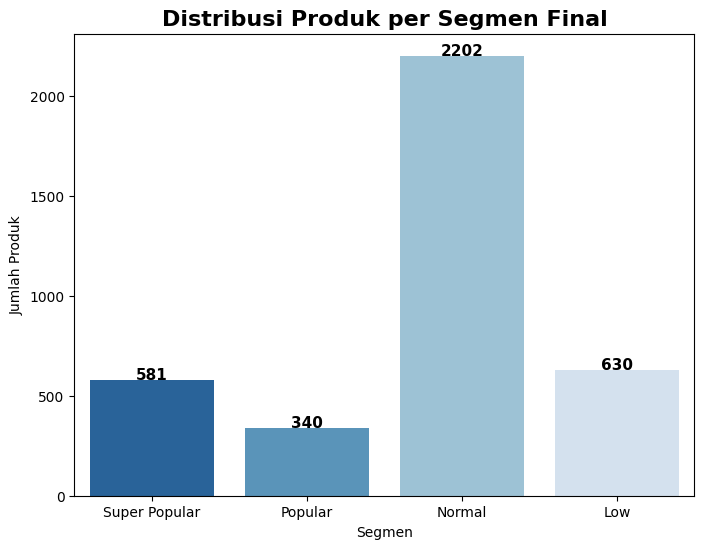

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\780174493.py:34: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




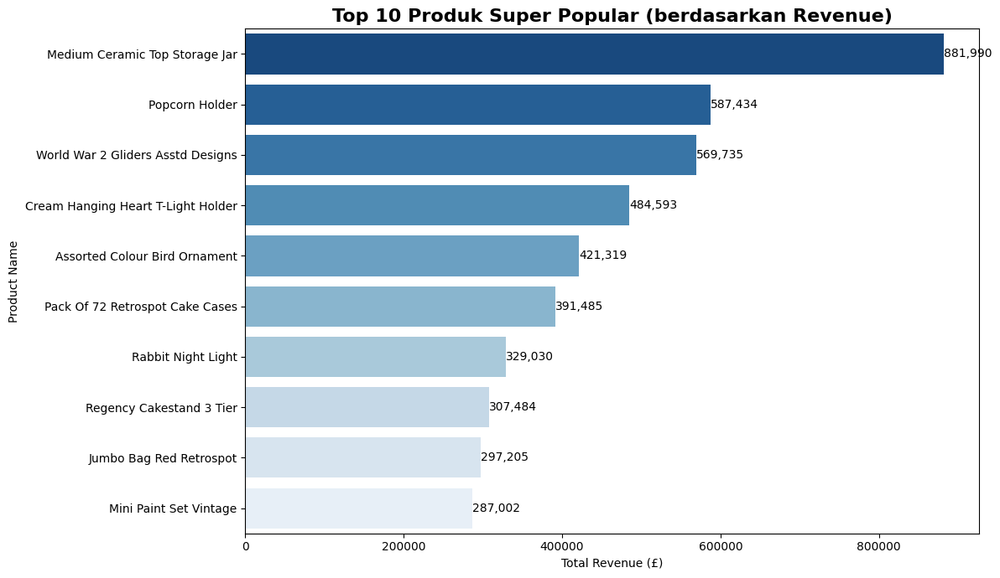

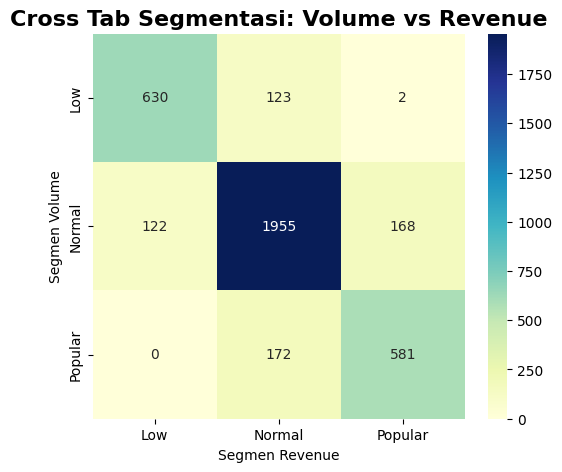

In [190]:
# VIsualisasi
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Distribusi Produk per Segmen Final
plt.figure(figsize=(8,6))
sns.countplot(
    data=product_summary,
    x='Segmen_Final',
    order=['Super Popular','Popular','Normal','Low'],
    palette="Blues_r"
)
plt.title("Distribusi Produk per Segmen Final", fontsize=16, weight='bold')
plt.xlabel("Segmen")
plt.ylabel("Jumlah Produk")
for i, v in enumerate(product_summary['Segmen_Final'].value_counts().reindex(['Super Popular','Popular','Normal','Low'])):
    plt.text(i, v + 2, str(v), ha='center', fontsize=11, weight='bold')
plt.show()

# 2. Top 10 Produk Super Popular (berdasarkan Revenue)
# --- Gabungkan product_summary dengan ProductName ---
product_info = df_sales[['ProductNo','ProductName']].drop_duplicates()
product_summary_named = product_summary.merge(product_info, on='ProductNo', how='left')

# --- Ambil Top 10 Produk Super Popular ---
top10_super = (
    product_summary_named[product_summary_named['Segmen_Final']=="Super Popular"]
    .sort_values("TotalRevenue", ascending=False)
    .head(10)
)

# --- Visualisasi ---
plt.figure(figsize=(12,7))
sns.barplot(
    data=top10_super,
    y="ProductName",
    x="TotalRevenue",
    palette="Blues_r"
)
plt.title("Top 10 Produk Super Popular (berdasarkan Revenue)", fontsize=16, weight='bold')
plt.xlabel("Total Revenue (£)")
plt.ylabel("Product Name")

# Tambahkan label angka di bar
for i, v in enumerate(top10_super['TotalRevenue']):
    plt.text(v, i, f"{v:,.0f}", va='center', fontsize=10)

plt.tight_layout()
plt.show()


# 3. Heatmap Korelasi Segmen Volume vs Revenue
crosstab = pd.crosstab(product_summary['Segmen_Volume'], product_summary['Segmen_Revenue'])

plt.figure(figsize=(6,5))
sns.heatmap(crosstab, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Cross Tab Segmentasi: Volume vs Revenue", fontsize=16, weight='bold')
plt.xlabel("Segmen Revenue")
plt.ylabel("Segmen Volume")
plt.show()


# Insight:

In [33]:
# Pertanyaan
# 1. Barang tipe apa yang masuk ke kategori super populer pada bulan November 2019?
# --- Filter data untuk bulan November 2019 ---
nov2019 = df_sales[(df_sales['Date'].dt.year == 2019) & (df_sales['Date'].dt.month == 11)]

# Hitung volume transaksi & revenue per produk (hanya November 2019)
product_summary_nov = nov2019.groupby('ProductNo').agg({
    'TransactionNo': 'nunique',
    'Revenue': 'sum'
}).rename(columns={'TransactionNo': 'VolumeTransaksi', 'Revenue': 'TotalRevenue'})

# Tentukan threshold quantile untuk bulan ini
q20_vol, q80_vol = product_summary_nov['VolumeTransaksi'].quantile([0.2, 0.8])
q20_rev, q80_rev = product_summary_nov['TotalRevenue'].quantile([0.2, 0.8])

# Segmentasi Volume
def segment_volume(x):
    if x >= q80_vol:
        return "Popular"
    elif x <= q20_vol:
        return "Low"
    else:
        return "Normal"

# Segmentasi Revenue
def segment_revenue(x):
    if x >= q80_rev:
        return "Popular"
    elif x <= q20_rev:
        return "Low"
    else:
        return "Normal"

product_summary_nov['Segmen_Volume'] = product_summary_nov['VolumeTransaksi'].apply(segment_volume)
product_summary_nov['Segmen_Revenue'] = product_summary_nov['TotalRevenue'].apply(segment_revenue)

# Segmentasi Final
def segment_final(row):
    vol, rev = row['Segmen_Volume'], row['Segmen_Revenue']
    if vol == "Popular" and rev == "Popular":
        return "Super Popular"
    elif (vol == "Popular" and rev == "Normal") or (rev == "Popular" and vol == "Normal"):
        return "Popular"
    elif vol == "Low" and rev == "Low":
        return "Low"
    else:
        return "Normal"

product_summary_nov['Segmen_Final'] = product_summary_nov.apply(segment_final, axis=1)

# Gabungkan dengan nama produk
product_info = df_sales[['ProductNo','ProductName']].drop_duplicates()
product_summary_nov = product_summary_nov.merge(product_info, on='ProductNo', how='left')

# Ambil hanya produk Super Popular
super_popular_nov2019 = product_summary_nov[product_summary_nov['Segmen_Final']=="Super Popular"]

# Tampilkan hasil
super_popular_nov2019 = super_popular_nov2019.sort_values("TotalRevenue", ascending=False)
super_popular_nov2019[['ProductNo','ProductName','VolumeTransaksi','TotalRevenue','Segmen_Final']].head(10)


,ProductNo,ProductName,VolumeTransaksi,TotalRevenue,Segmen_Final
1599,23084,Rabbit Night Light,487,159889.96,Super Popular
842,22197,Popcorn Holder,244,123424.90,Super Popular
751,22086,Paper Chain Kit 50'S Christmas,390,95293.96,Super Popular
2574,85123A,Cream Hanging Heart T-Light Holder,260,57392.52,Super Popular
2459,84879,Assorted Colour Bird Ornament,205,56538.85,Super Popular
1155,22578,Wooden Star Christmas Scandinavian,242,50176.01,Super Popular
1154,22577,Wooden Heart Christmas Scandinavian,228,46995.75,Super Popular
2348,84077,World War 2 Gliders Asstd Designs,85,44620.49,Super Popular
1445,22910,Paper Chain Kit Vintage Christmas,276,44048.54,Super Popular
652,21915,Red Harmonica In Box,68,42561.66,Super Popular


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2094603189.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




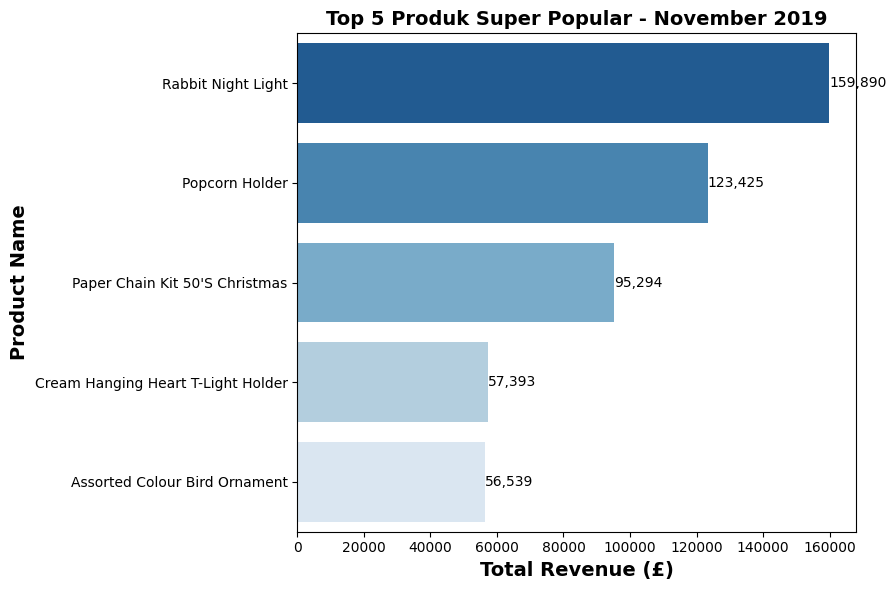

In [267]:
# Visualisasi Super Popular pada November 2019
# --- Filter produk Super Popular November 2019 ---
super_popular_nov2019 = product_summary_nov[product_summary_nov['Segmen_Final']=="Super Popular"]

# Ambil Top 10 berdasarkan Revenue
top10_super_nov2019 = super_popular_nov2019.sort_values("TotalRevenue", ascending=False).head(5)

# --- Visualisasi ---
plt.figure(figsize=(9,6))
sns.barplot(
    data=top10_super_nov2019,
    y="ProductName",
    x="TotalRevenue",
    palette="Blues_r"
)
plt.title("Top 5 Produk Super Popular - November 2019", fontsize=14, weight='bold')
plt.xlabel("Total Revenue (£)", fontsize=14, weight='bold')
plt.ylabel("Product Name", fontsize=14, weight='bold')

# Tambahkan label angka di bar
for i, v in enumerate(top10_super_nov2019["TotalRevenue"]):
    plt.text(v, i, f"{v:,.0f}", va='center', fontsize=10)

plt.tight_layout()
plt.show()



# Insight: 
Top 10 Produk Super Popular - November 2019 menunjukkan produk pendapatan tertinggi yakni Rabbit Night LIght sekitar £159,890

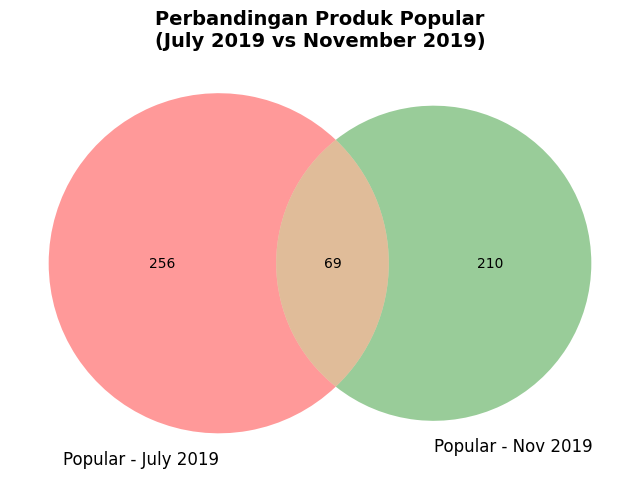

,Same Popular,Unique July,Unique November
0,Mint Kitchen Scales,Blue Polkadot Cup,French Enamel Candleholder
1,Heart Filigree Dove Small,Candy Spot Heart Decoration,Coffee Mug Dog + Ball Design
2,Alarm Clock Bakelike Chocolate,Picnic Basket Wicker Small,Set Of 6 3d Kit Cards For Kids
3,Skull Lunch Box With Cutlery,Danish Rose Photo Frame,12 Pencils Small Tube Skull
4,Glass Bon Bon Jar,Pack Of 20 Skull Paper Napkins,Pack Of 12 Spaceboy Tissues


In [273]:
# Pertanyaan:
# 2. Apakah barang yang populer di November 2019 sama dengan barang yang populer di July 2019?
# --- Function: Segmentasi produk per bulan ---
def product_segmentation_month(df, year, month):
    # Filter data bulan tertentu
    df_month = df[(df['Date'].dt.year == year) & (df['Date'].dt.month == month)]
    
    # Ringkasan per produk
    summary = df_month.groupby('ProductNo').agg({
        'TransactionNo': 'nunique',
        'Revenue': 'sum'
    }).rename(columns={'TransactionNo': 'VolumeTransaksi', 'Revenue': 'TotalRevenue'})
    
    # Quantile
    q20_vol, q80_vol = summary['VolumeTransaksi'].quantile([0.2, 0.8])
    q20_rev, q80_rev = summary['TotalRevenue'].quantile([0.2, 0.8])
    
    # Segmentasi Volume
    summary['Segmen_Volume'] = summary['VolumeTransaksi'].apply(
        lambda x: "Popular" if x >= q80_vol else ("Low" if x <= q20_vol else "Normal")
    )
    # Segmentasi Revenue
    summary['Segmen_Revenue'] = summary['TotalRevenue'].apply(
        lambda x: "Popular" if x >= q80_rev else ("Low" if x <= q20_rev else "Normal")
    )
    
    # Segmentasi Final
    def segment_final(row):
        vol, rev = row['Segmen_Volume'], row['Segmen_Revenue']
        if vol == "Popular" and rev == "Popular":
            return "Super Popular"
        elif (vol == "Popular" and rev == "Normal") or (rev == "Popular" and vol == "Normal"):
            return "Popular"
        elif vol == "Low" and rev == "Low":
            return "Low"
        else:
            return "Normal"
    summary['Segmen_Final'] = summary.apply(segment_final, axis=1)
    
    # Gabungkan dengan nama produk
    product_info = df[['ProductNo','ProductName']].drop_duplicates()
    summary = summary.merge(product_info, on='ProductNo', how='left')
    
    return summary

# --- Ambil data Popular Juli & November 2019 ---
popular_july = product_segmentation_month(df_sales, 2019, 7)
popular_nov = product_segmentation_month(df_sales, 2019, 11)

popular_july_set = set(popular_july[popular_july['Segmen_Final']=="Popular"]['ProductNo'])
popular_nov_set = set(popular_nov[popular_nov['Segmen_Final']=="Popular"]['ProductNo'])

# --- Mapping ProductNo -> ProductName ---
product_map = dict(zip(df_sales['ProductNo'], df_sales['ProductName']))

# --- Konversi set ke nama produk ---
popular_july_names = {product_map.get(p, p) for p in popular_july_set}
popular_nov_names = {product_map.get(p, p) for p in popular_nov_set}

# --- Irisan produk Popular ---
only_july = popular_july_names - popular_nov_names
only_nov = popular_nov_names - popular_july_names
both = popular_july_names & popular_nov_names

# --- Visualisasi Venn Diagram ---
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

plt.figure(figsize=(8,6))
venn2([popular_july_names, popular_nov_names],
      set_labels=("Popular - July 2019", "Popular - Nov 2019")),
plt.title("Perbandingan Produk Popular\n(July 2019 vs November 2019)", fontsize=14, weight='bold')
plt.show()

# --- Tabel Perbandingan (ambil max 10 tiap kategori biar ringkas) ---
df_compare = pd.DataFrame({
    "Same Popular": list(both)[:10],
    "Unique July": list(only_july)[:10],
    "Unique November": list(only_nov)[:10]
})

df_compare.head(5)


Jumlah produk Super Popular Juli 2019 : 371
Jumlah produk Super Popular Nov 2019  : 441
Jumlah produk sama di kedua bulan     : 201


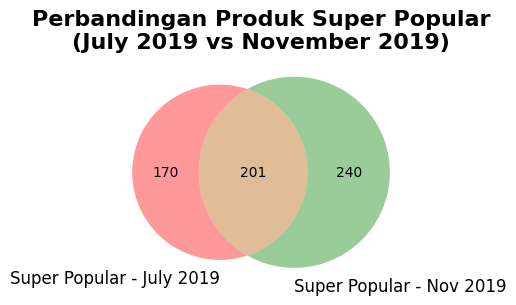

,Same Super Popular,Unique July,Unique November
0,Plasters In Tin Woodland Animals,Pack Of 6 Cocktail Parasol Straws,Ladies & Gentlemen Metal Sign
1,Party Bunting,Doormat English Rose,Jumbo Bag Paisley Park
2,Set Of 6 Snack Loaf Baking Cases,12 Pencils Small Tube Skull,Christmas Musical Zinc Star
3,Gardeners Kneeling Pad Cup Of Tea,Card Party Games,Card Motorbike Santa
4,Pack Of 60 Dinosaur Cake Cases,Polkadot Pen,Pack Of 12 50'S Christmas Tissues
5,English Rose Notebook A7 Size,Regency Teapot Roses,Set Of 6 T-Lights Santa
6,Jumbo Bag Vintage Doily,Wrap Vintage Doily,4 Vanilla Botanical Candles
7,Set Of 4 Knick Knack Tins Doily,Bread Bin Diner Style Ivory,Ribbon Reel Making Snowmen
8,Alarm Clock Bakelike Pink,Card Dolly Girl,Revolver Wooden Ruler
9,Pack Of 12 Suki Tissues,Strawberry Lunch Box With Cutlery,English Rose Hot Water Bottle


In [283]:
# Pertanyaan:
# 3. Apakah barang yang masuk kategori super populer di november sama dengan barang super populer di July ?
# --- Ambil produk Super Popular Juli & November 2019 ---
# --- Fungsi segmentasi produk per bulan ---
def product_segmentation_month(df, year, month):
    # Filter data bulan tertentu
    df_month = df[(df['Date'].dt.year == year) & (df['Date'].dt.month == month)]
    
    # Ringkasan per produk
    summary = df_month.groupby('ProductNo').agg({
        'TransactionNo': 'nunique',
        'Revenue': 'sum'
    }).rename(columns={'TransactionNo': 'VolumeTransaksi', 'Revenue': 'TotalRevenue'})
    
    # Quantile
    q20_vol, q80_vol = summary['VolumeTransaksi'].quantile([0.2, 0.8])
    q20_rev, q80_rev = summary['TotalRevenue'].quantile([0.2, 0.8])
    
    # Segmentasi Volume
    summary['Segmen_Volume'] = summary['VolumeTransaksi'].apply(
        lambda x: "Popular" if x >= q80_vol else ("Low" if x <= q20_vol else "Normal")
    )
    # Segmentasi Revenue
    summary['Segmen_Revenue'] = summary['TotalRevenue'].apply(
        lambda x: "Popular" if x >= q80_rev else ("Low" if x <= q20_rev else "Normal")
    )
    
    # Segmentasi Final
    def segment_final(row):
        vol, rev = row['Segmen_Volume'], row['Segmen_Revenue']
        if vol == "Popular" and rev == "Popular":
            return "Super Popular"
        elif (vol == "Popular" and rev == "Normal") or (rev == "Popular" and vol == "Normal"):
            return "Popular"
        elif vol == "Low" and rev == "Low":
            return "Low"
        else:
            return "Normal"
    summary['Segmen_Final'] = summary.apply(segment_final, axis=1)
    
    # Gabungkan dengan nama produk
    product_info = df[['ProductNo','ProductName']].drop_duplicates()
    summary = summary.merge(product_info, on='ProductNo', how='left')
    
    return summary

# --- Ambil data segmentasi produk Juli & November 2019 ---
seg_july = product_segmentation_month(df_sales, 2019, 7)
seg_nov  = product_segmentation_month(df_sales, 2019, 11)

# --- Filter produk super populer ---
super_july_set = set(seg_july[seg_july['Segmen_Final']=="Super Popular"]['ProductNo'])
super_nov_set  = set(seg_nov[seg_nov['Segmen_Final']=="Super Popular"]['ProductNo'])

# Mapping ProductNo -> ProductName
product_map = dict(zip(df_sales['ProductNo'], df_sales['ProductName']))
super_july_names = {product_map.get(p, p) for p in super_july_set}
super_nov_names  = {product_map.get(p, p) for p in super_nov_set}

# --- Perbandingan ---
only_july = super_july_names - super_nov_names
only_nov  = super_nov_names - super_july_names
both      = super_july_names & super_nov_names

print("Jumlah produk Super Popular Juli 2019 :", len(super_july_names))
print("Jumlah produk Super Popular Nov 2019  :", len(super_nov_names))
print("Jumlah produk sama di kedua bulan     :", len(both))

# --- Visualisasi Venn Diagram ---
from matplotlib_venn import venn2
import matplotlib.pyplot as plt

plt.figure(figsize=(5,3))
venn2([super_july_names, super_nov_names],
      set_labels=("Super Popular - July 2019", "Super Popular - Nov 2019"))
plt.title("Perbandingan Produk Super Popular\n(July 2019 vs November 2019)", fontsize=16, weight='bold')
plt.show()

# --- Tabel Perbandingan (ambil max 10 biar ringkas) ---
import pandas as pd
df_compare = pd.DataFrame({
    "Same Super Popular": list(both)[:10],
    "Unique July": list(only_july)[:10],
    "Unique November": list(only_nov)[:10]
})
df_compare


# Insight:

# Pareto Analysisof Products  
# Tujuan: Mengidentifikasi produk-produk yang berkontribusi paling besar terhadap revenue (80/20 rule).  

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2583503489.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



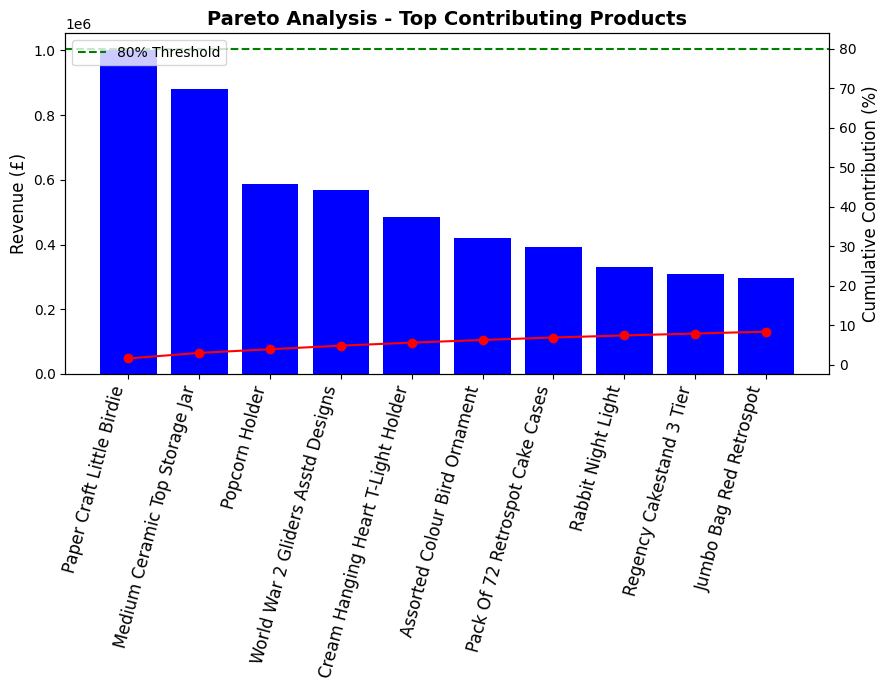

Jumlah produk yang menyumbang 80% revenue: 931


In [295]:
# Exploratory Data Top Contribution 
# Pareto Analysis (80/20 Rule)
# Apakah benar 20 % produk menyumbang 80 % revenue?

# --- 1. Hitung total revenue per produk ---
pareto = df_sales.groupby('ProductName').agg({
    'Revenue': 'sum'
}).sort_values(by='Revenue', ascending=False).reset_index()

# --- 2. Hitung cumulative percentage ---
pareto['CumulativeRevenue'] = pareto['Revenue'].cumsum()
pareto['CumulativePerc'] = 100 * pareto['CumulativeRevenue'] / pareto['Revenue'].sum()

# --- 3. Visualisasi Pareto Chart ---
fig, ax1 = plt.subplots(figsize=(9,7))

# Bar chart (Revenue per produk)
ax1.bar(pareto['ProductName'][:10], pareto['Revenue'][:10], color="blue")
ax1.set_ylabel("Revenue (£)", fontsize=12)
ax1.set_xticklabels(pareto['ProductName'][:10], rotation=75, ha='right',  fontsize=12)
ax1.set_title("Pareto Analysis - Top Contributing Products", fontsize=14, weight='bold')

# Line cumulative %
ax2 = ax1.twinx()
ax2.plot(pareto['ProductName'][:10], pareto['CumulativePerc'][:10], color="red", marker="o")
ax2.axhline(80, color="green", linestyle="--", label="80% Threshold")
ax2.set_ylabel("Cumulative Contribution (%)", fontsize=12)
ax2.legend(loc="upper left")

# --- Hilangkan grid ---
ax1.grid(False)
ax2.grid(False)

plt.tight_layout()
plt.show()

# --- 4. Cari titik Pareto (produk yang menyumbang 80%) ---
pareto_cutoff = pareto[pareto['CumulativePerc'] <= 80]
print(f"Jumlah produk yang menyumbang 80% revenue: {len(pareto_cutoff)}")


# Insight:

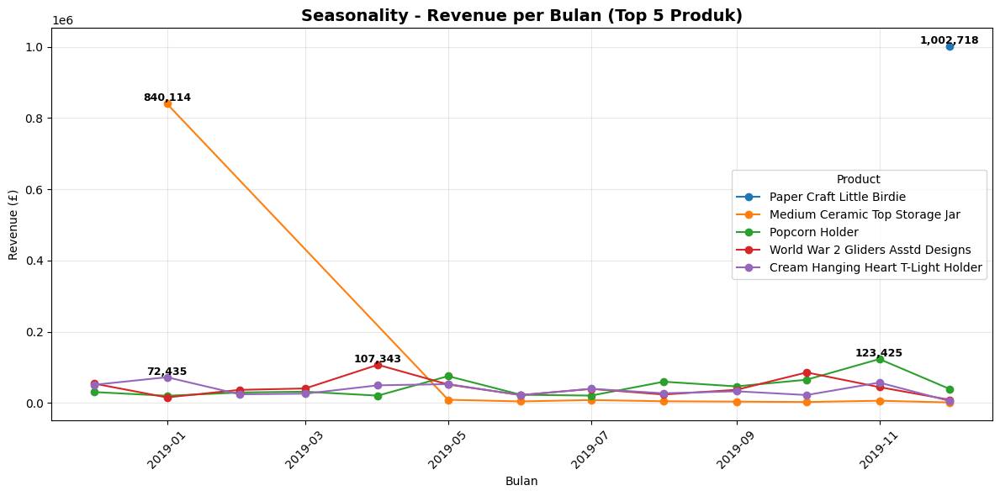

In [67]:
# Exploratory Data Top Contribution
# Seasonality pada Produk Top 
# Apakah produk tertentu lebih laku di bulan tertentu?
# --- 1. Ambil Top 5 produk berdasarkan total revenue ---
top_products = (
    df_sales.groupby('ProductName')['Revenue']
    .sum()
    .sort_values(ascending=False)
    .head(5)
    .index
)

# --- 2. Filter data hanya untuk Top 5 produk ---
df_top = df_sales[df_sales['ProductName'].isin(top_products)].copy()

# --- 3. Buat agregasi per bulan ---
df_top['YearMonth'] = df_top['Date'].dt.to_period('M')
seasonality = df_top.groupby(['YearMonth','ProductName'])['Revenue'].sum().reset_index()
seasonality['YearMonth'] = seasonality['YearMonth'].dt.to_timestamp()

# --- 4. Visualisasi Seasonality Line Chart ---
plt.figure(figsize=(12,6))

for product in top_products:
    data_product = seasonality[seasonality['ProductName']==product]
    plt.plot(data_product['YearMonth'], data_product['Revenue'], marker='o', label=product)
    
    # Cari titik tertinggi
    max_row = data_product.loc[data_product['Revenue'].idxmax()]
    plt.text(max_row['YearMonth'], max_row['Revenue'], 
             f"{max_row['Revenue']:,.0f}", 
             ha='center', va='bottom', fontsize=9, weight='bold', color='black')

plt.title("Seasonality - Revenue per Bulan (Top 5 Produk)", fontsize=14, weight='bold')
plt.xlabel("Bulan")
plt.ylabel("Revenue (£)")
plt.legend(title="Product")
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


# Insight: Seasonality Produk Top

# Customer Segmentation:

    Segmen_Final  Jumlah Transaksi
0            Low              1419
1         Normal             16051
2        Popular             14483
3  Super Popular             18734


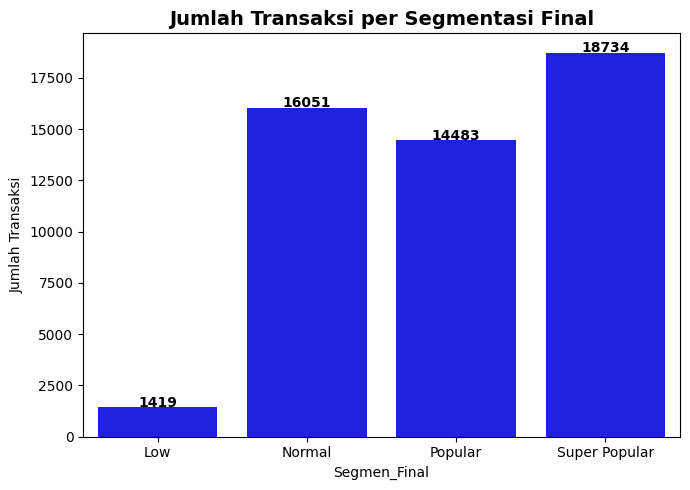

In [89]:
# Exploratory Data 
# Jumlah Transasksi untuk Kategori Segmentasi Final 
# --- Hitung segmentasi final per produk (dari semua data) ---
product_summary = df_sales.groupby('ProductNo').agg({
    'TransactionNo': 'nunique',
    'Revenue': 'sum'
}).rename(columns={'TransactionNo': 'VolumeTransaksi', 'Revenue': 'TotalRevenue'}).reset_index()

# Tambahkan segmen (pakai logika sebelumnya)
q20_vol, q80_vol = product_summary['VolumeTransaksi'].quantile([0.2, 0.8])
q20_rev, q80_rev = product_summary['TotalRevenue'].quantile([0.2, 0.8])

def segment_final(row):
    vol = ("Popular" if row['VolumeTransaksi'] >= q80_vol else ("Low" if row['VolumeTransaksi'] <= q20_vol else "Normal"))
    rev = ("Popular" if row['TotalRevenue'] >= q80_rev else ("Low" if row['TotalRevenue'] <= q20_rev else "Normal"))
    if vol=="Popular" and rev=="Popular":
        return "Super Popular"
    elif (vol=="Popular" and rev=="Normal") or (rev=="Popular" and vol=="Normal"):
        return "Popular"
    elif vol=="Low" and rev=="Low":
        return "Low"
    else:
        return "Normal"

product_summary['Segmen_Final'] = product_summary.apply(segment_final, axis=1)

# --- Hitung jumlah transaksi per segmen ---
segmen_transaksi = (
    df_sales.merge(product_summary[['ProductNo','Segmen_Final']], on='ProductNo')
    .groupby('Segmen_Final')['TransactionNo'].nunique()
    .reset_index()
    .rename(columns={'TransactionNo':'Jumlah Transaksi'})
)

print(segmen_transaksi)

# --- Visualisasi ---
plt.figure(figsize=(7,5))
sns.barplot(data=segmen_transaksi, 
            x='Segmen_Final', 
            y='Jumlah Transaksi', 
            color='blue')  # <-- ganti palette jadi biru

# Tambahkan judul dan label angka
plt.title("Jumlah Transaksi per Segmentasi Final", fontsize=14, weight='bold')
for i, v in enumerate(segmen_transaksi['Jumlah Transaksi']):
    plt.text(i, v+5, str(v), ha='center', fontsize=10, weight='bold', color='black')

# Hilangkan grid
plt.grid(False)

plt.tight_layout()
plt.show()



    Segmen_Final  Total Revenue
0            Low       97754.03
1         Normal    14239921.74
2        Popular     9014854.22
3  Super Popular    39613444.35


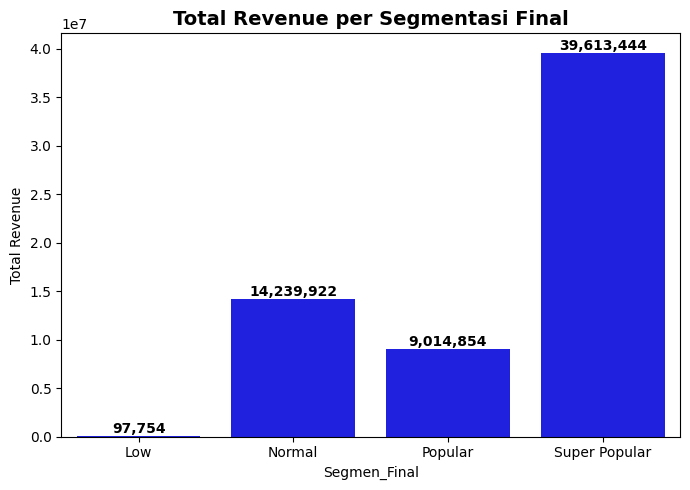

In [91]:
# Exploratory Data
# Total Revenue Per Segmentasi Final 
# --- Hitung revenue per segmen ---
segmen_revenue = (
    df_sales.merge(product_summary[['ProductNo','Segmen_Final']], on='ProductNo')
    .groupby('Segmen_Final')['Revenue'].sum()
    .reset_index()
    .rename(columns={'Revenue':'Total Revenue'})
)

print(segmen_revenue)

# --- Visualisasi 
plt.figure(figsize=(7,5))
sns.barplot(data=segmen_revenue, 
            x='Segmen_Final', 
            y='Total Revenue', 
            color='blue')  # <-- ganti ke biru solid

# Tambahkan judul & label angka
plt.title("Total Revenue per Segmentasi Final", fontsize=14, weight='bold')
for i, v in enumerate(segmen_revenue['Total Revenue']):
    plt.text(i, v, f"{v:,.0f}", ha='center', va='bottom', fontsize=10, weight='bold', color='black')

plt.xticks(rotation=0)
plt.grid(False)  # grid dihilangkan
plt.tight_layout()
plt.show()


# Insight:

   Segmen_Harga  Jumlah Produk
0    High Price           1896
1     Low Price           2927
2  Medium Price           2772


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2367750406.py:29: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




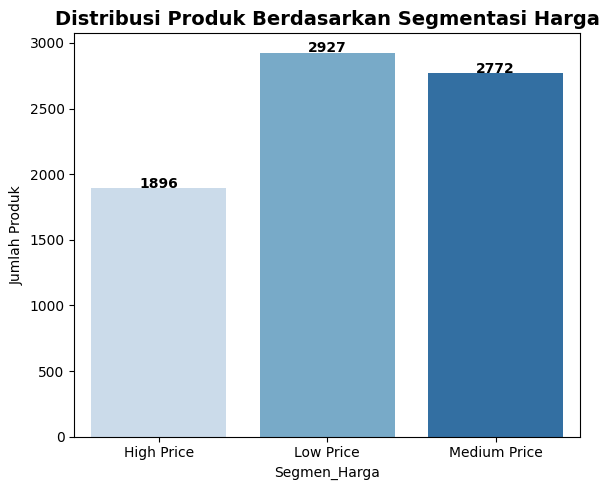

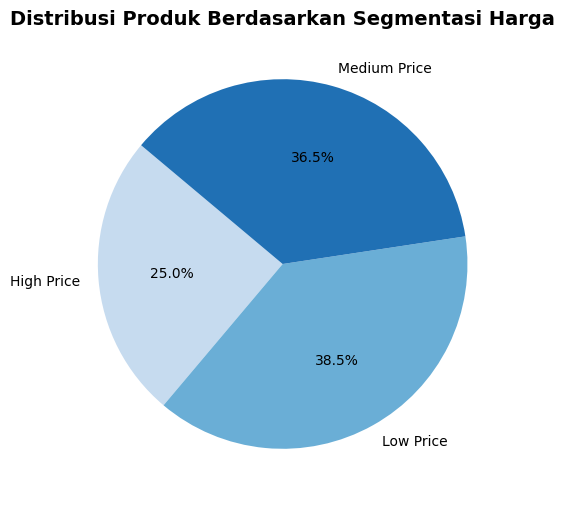

In [303]:
# Exploratory Data
# Distribusi Produk Berdasarkan Segmentasi Harga
# --- Segmentasi Harga ---
q1_price = df_sales['Price'].quantile(0.25)
q3_price = df_sales['Price'].quantile(0.75)

def price_segment(price):
    if price <= q1_price:
        return "Low Price"
    elif price <= q3_price:
        return "Medium Price"
    else:
        return "High Price"

df_sales['Segmen_Harga'] = df_sales['Price'].apply(price_segment)

# --- Distribusi Produk per Segmen Harga ---
price_distribution = (
    df_sales[['ProductNo','Segmen_Harga']].drop_duplicates()
    .groupby('Segmen_Harga')['ProductNo'].count()
    .reset_index()
    .rename(columns={'ProductNo':'Jumlah Produk'})
)

print(price_distribution)

# --- Visualisasi Barplot ---
plt.figure(figsize=(6,5))
sns.barplot(data=price_distribution, 
            x='Segmen_Harga', 
            y='Jumlah Produk', 
            palette='Blues')  # <- ganti ke gradasi biru
plt.title("Distribusi Produk Berdasarkan Segmentasi Harga", fontsize=14, weight='bold')

for i,v in enumerate(price_distribution['Jumlah Produk']):
    plt.text(i, v+2, str(v), ha='center', fontsize=10, weight='bold')

plt.tight_layout()
plt.show()

# --- Visualisasi Pie Chart (gradasi biru) ---
plt.figure(figsize=(6,6))
plt.pie(price_distribution['Jumlah Produk'], 
        labels=price_distribution['Segmen_Harga'], 
        autopct='%1.1f%%', 
        startangle=140, 
        colors=sns.color_palette('Blues', n_colors=len(price_distribution)))  # <- gradasi biru
plt.title("Distribusi Produk Berdasarkan Segmentasi Harga", fontsize=14, weight='bold')
plt.show()


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\354928915.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


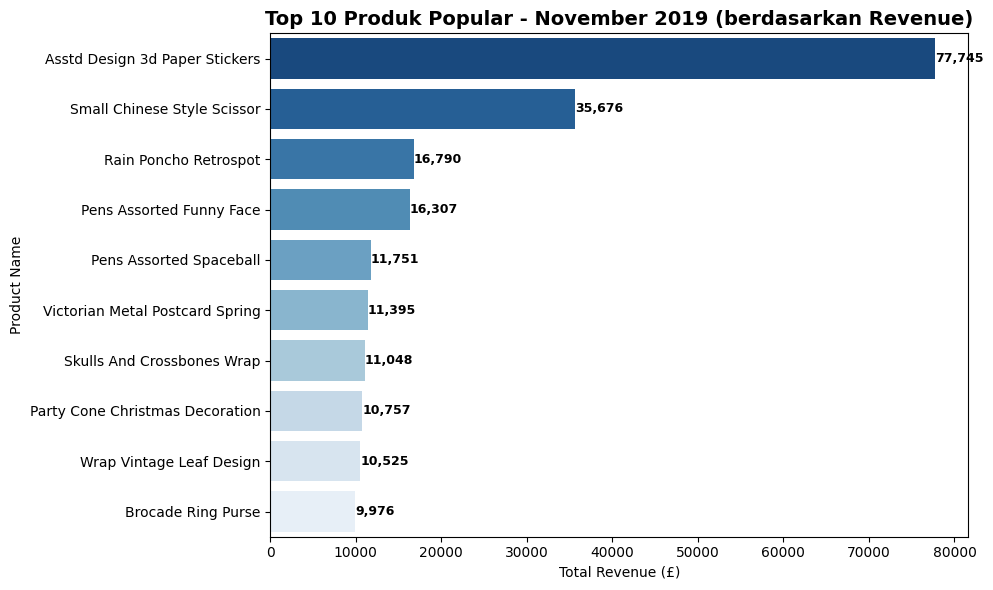

In [99]:
# Exploratory Data
# Top 10 Produk kategori Popular bulan November 2019
# --- Ambil data segmentasi bulan November 2019 ---
november_2019 = product_segmentation_month(df_sales, 2019, 11)

# Filter hanya produk dengan segmen "Popular"
popular_nov = november_2019[november_2019['Segmen_Final']=="Popular"]

# Ambil Top 10 berdasarkan TotalRevenue
top10_popular_nov = (
    popular_nov.sort_values("TotalRevenue", ascending=False)
    .head(10)
)

# --- Visualisasi ---
plt.figure(figsize=(10,6))
sns.barplot(
    data=top10_popular_nov,
    y="ProductName",
    x="TotalRevenue",
    palette="Blues_r"   # <-- ganti ke gradasi biru
)
plt.title("Top 10 Produk Popular - November 2019 (berdasarkan Revenue)", fontsize=14, weight='bold')
plt.xlabel("Total Revenue (£)")
plt.ylabel("Product Name")

# Tambahkan label angka di ujung bar
for i, v in enumerate(top10_popular_nov['TotalRevenue']):
    plt.text(v, i, f"{v:,.0f}", va='center', fontsize=9, weight='bold', color='black')

plt.tight_layout()
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2505397120.py:28: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2505397120.py:42: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


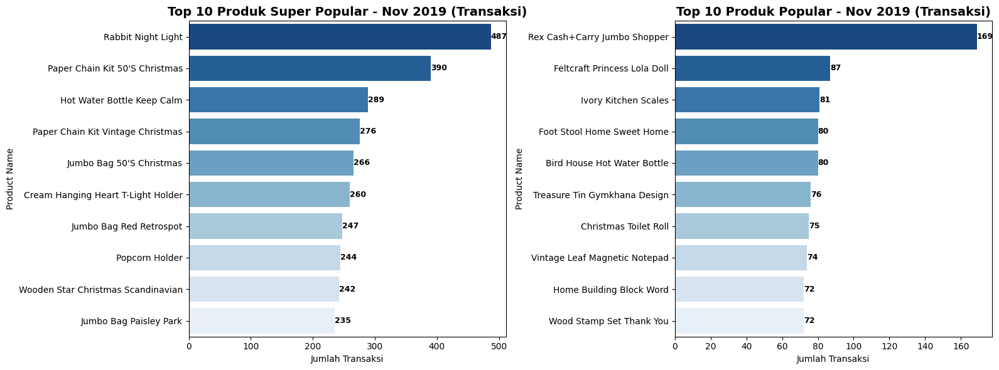

In [101]:
# EXploratory Data 
# Top 10 Produk Super Popular dan Popular di Bulan November Berdasarkan Transasksi (Penjualan)
# --- Segmentasi bulan November 2019 ---
november_2019 = product_segmentation_month(df_sales, 2019, 11)

# --- Filter produk Super Popular ---
super_popular_nov = november_2019[november_2019['Segmen_Final']=="Super Popular"]

# Ambil Top 10 berdasarkan VolumeTransaksi
top10_super_nov = (
    super_popular_nov.sort_values("VolumeTransaksi", ascending=False)
    .head(10)
)

# --- Filter produk Popular ---
popular_nov = november_2019[november_2019['Segmen_Final']=="Popular"]

# Ambil Top 10 berdasarkan VolumeTransaksi
top10_popular_nov = (
    popular_nov.sort_values("VolumeTransaksi", ascending=False)
    .head(10)
)

# --- Visualisasi ---
fig, axes = plt.subplots(1, 2, figsize=(16,6))

# A. Super Popular
sns.barplot(
    data=top10_super_nov,
    y="ProductName",
    x="VolumeTransaksi",
    palette="Blues_r",   # <- ganti biru gradasi
    ax=axes[0]
)
axes[0].set_title("Top 10 Produk Super Popular - Nov 2019 (Transaksi)", fontsize=14, weight='bold')
axes[0].set_xlabel("Jumlah Transaksi")
axes[0].set_ylabel("Product Name")
for i, v in enumerate(top10_super_nov['VolumeTransaksi']):
    axes[0].text(v, i, str(v), va='center', fontsize=9, weight='bold')

# B. Popular
sns.barplot(
    data=top10_popular_nov,
    y="ProductName",
    x="VolumeTransaksi",
    palette="Blues_r",   # <- ganti biru gradasi
    ax=axes[1]
)
axes[1].set_title("Top 10 Produk Popular - Nov 2019 (Transaksi)", fontsize=14, weight='bold')
axes[1].set_xlabel("Jumlah Transaksi")
axes[1].set_ylabel("Product Name")
for i, v in enumerate(top10_popular_nov['VolumeTransaksi']):
    axes[1].text(v, i, str(v), va='center', fontsize=9, weight='bold')

plt.tight_layout()
plt.show()


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2684068224.py:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(
C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2684068224.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


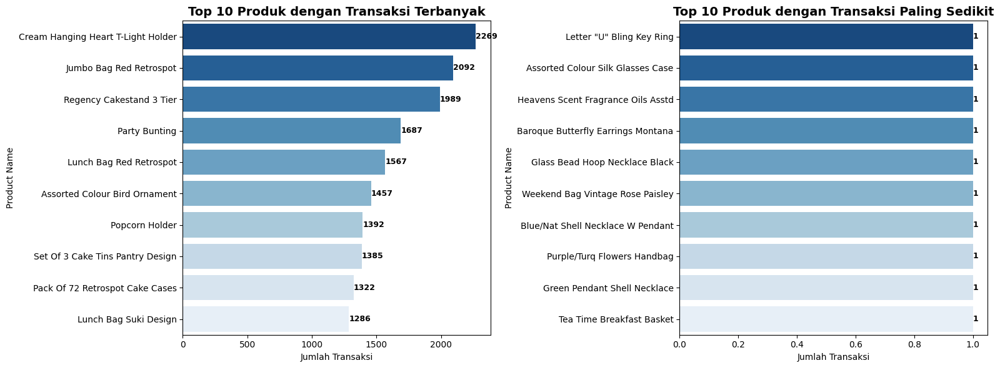

In [103]:
# EXploratory Data
# JUmlah Produk Transaksi Terbanyak dan Sedikit
# --- Ringkasan jumlah transaksi per produk ---
product_transaction_summary = (
    df_sales.groupby(['ProductNo','ProductName'])
    .agg({'TransactionNo':'nunique'})
    .rename(columns={'TransactionNo':'VolumeTransaksi'})
    .reset_index()
)

# --- Top 10 transaksi terbanyak ---
top10_transaksi_terbanyak = (
    product_transaction_summary.sort_values("VolumeTransaksi", ascending=False)
    .head(10)
)

# --- Top 10 transaksi paling sedikit ---
top10_transaksi_sedikit = (
    product_transaction_summary.sort_values("VolumeTransaksi", ascending=True)
    .head(10)
)

# --- Visualisasi ---
fig, axes = plt.subplots(1, 2, figsize=(16,6))

# A. Top 10 Transaksi Terbanyak
sns.barplot(
    data=top10_transaksi_terbanyak,
    y="ProductName",
    x="VolumeTransaksi",
    palette="Blues_r",   # <- diganti biru
    ax=axes[0]
)
axes[0].set_title("Top 10 Produk dengan Transaksi Terbanyak", fontsize=14, weight='bold')
axes[0].set_xlabel("Jumlah Transaksi")
axes[0].set_ylabel("Product Name")
for i, v in enumerate(top10_transaksi_terbanyak['VolumeTransaksi']):
    axes[0].text(v, i, str(v), va='center', fontsize=9, weight='bold')

# B. Top 10 Transaksi Paling Sedikit
sns.barplot(
    data=top10_transaksi_sedikit,
    y="ProductName",
    x="VolumeTransaksi",
    palette="Blues_r",   # <- diganti biru
    ax=axes[1]
)
axes[1].set_title("Top 10 Produk dengan Transaksi Paling Sedikit", fontsize=14, weight='bold')
axes[1].set_xlabel("Jumlah Transaksi")
axes[1].set_ylabel("Product Name")
for i, v in enumerate(top10_transaksi_sedikit['VolumeTransaksi']):
    axes[1].text(v, i, str(v), va='center', fontsize=9, weight='bold')

plt.tight_layout()
plt.show()

# Retention Cohort Analysis

Analisis kohort adalah metode analisis yang digunakan untuk mempelajari perilaku konsumen atau pengguna dari kelompok yang sama dalam periode waktu tertentu.   
Contoh Kohort : Kohort kustomer yang bergabung pada bulan mei

Analisis retensi adalah analisis untuk melihat seberapa besar persentase pengguna atau pelanggan yang kembali menggunakan produk atau layanan dalam periode waktu tertentu.

Dengan menganalisis kohort dan retensi, perusahaan atau organisasi dapat mengidentifikasi tren dan pola dalam perilaku pengguna atau pelanggan.

Berikut cuplikan matriks retensi yang akan kalian hasilkan pada bagian ini : 

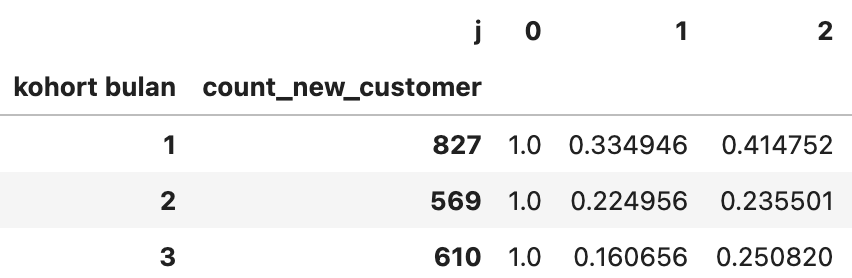

Cara baca :  
Pada bulan januari, ada 827 customer baru.  
33% dari 827 customer melakukan transaksi 1 bulan kemudian.  
41.4% dari 827 customer melakukan transasksi 2 bulan kemduain.  

Hal ini menunjukkan bahwa sekitar sepertiga customer yang melanjutkan transaksi setelah mendaftar pada bulan januari.  

Sedangkan pada kohort bulan februari, ada 569 customer baru dan hanya 22% customer yang kembali bertransaksi sebulan setelahnya  

Buatlah matriks kohort retensi per bulan menggunakan data dari 1 januari 2019 hingga 30 november 2019
Petunjuk : 
1. Hitung tanggal berapa transaksi pertama customer. Disini kita menggunakna asumsi bahwa transaksi pertama pada tahun 2019 adalah transaksi pertama customer.
2. Lakukan iterasi untuk setiap bulan. Ambil berapa banyak customer yang mendaftar dan berapa banyak customer yang sama yang melakukan transaksi di bulan bulan berikutnya.

## Pertanyaan
1. Bagaimana karakteristik pertumbuhan customer baru? Apakah pertumbuhan terus meningkat atau melambat?

2. Setiap bulannya tim marketing menggunakan metode promosi campaign yang berbeda-beda. Bulan mana yang menghasilkan retention paling tinggi?

# Cohort Analysis
# Hitung tanggal berapa transaksi pertama customer. Disini kita menggunakna asumsi bahwa transaksi pertama pada tahun 2019 adalah transaksi pertama customer

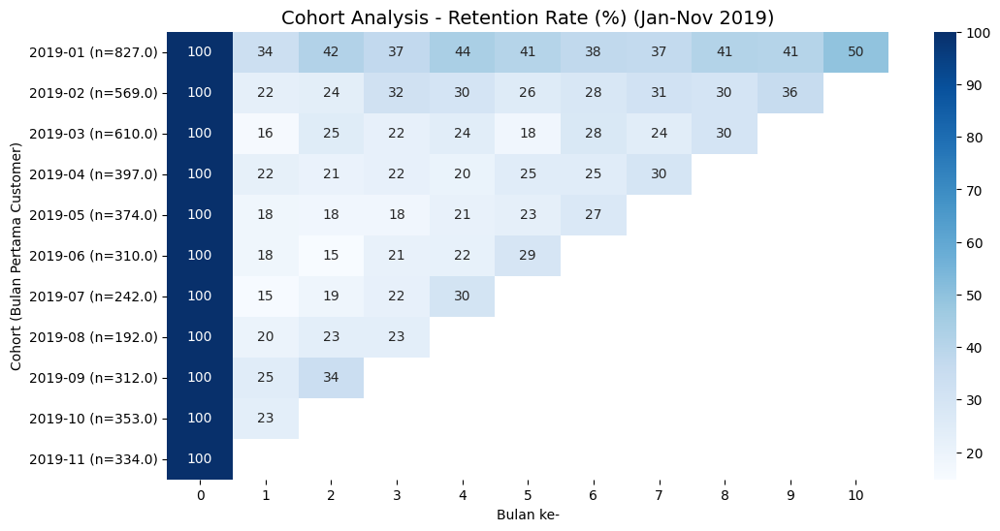

Jumlah customer baru per cohort:
CohortMonth
2019-01-01    827.0
2019-02-01    569.0
2019-03-01    610.0
2019-04-01    397.0
2019-05-01    374.0
2019-06-01    310.0
2019-07-01    242.0
2019-08-01    192.0
2019-09-01    312.0
2019-10-01    353.0
2019-11-01    334.0
Name: 0, dtype: float64

Retention bulan pertama (CohortIndex=1):
2019-01 (n=827.0)    33.5
2019-09 (n=312.0)    24.7
2019-10 (n=353.0)    23.2
2019-02 (n=569.0)    22.5
2019-04 (n=397.0)    22.4
2019-08 (n=192.0)    19.8
2019-05 (n=374.0)    18.4
2019-06 (n=310.0)    18.4
2019-03 (n=610.0)    16.1
2019-07 (n=242.0)    15.3
2019-11 (n=334.0)     NaN
Name: 1, dtype: float64


In [196]:
# Cohort Retention Analysis 2019

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Pastikan kolom Date jadi datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# 2. Filter data Jan - Nov 2019
mask = (df_sales['Date'] >= '2019-01-01') & (df_sales['Date'] <= '2019-11-30')
df_2019 = df_sales.loc[mask].copy()

# 3. Buat kolom InvoiceMonth (awal bulan transaksi)
df_2019['InvoiceMonth'] = df_2019['Date'].dt.to_period('M').dt.to_timestamp()

# 4. Tentukan CohortMonth (bulan pertama customer di 2019)
df_2019['CohortMonth'] = df_2019.groupby('CustomerNo')['InvoiceMonth'].transform('min')

# 5. Hitung CohortIndex (jarak bulan dari cohort month)
df_2019['CohortIndex'] = (
    (df_2019['InvoiceMonth'].dt.year - df_2019['CohortMonth'].dt.year) * 12 +
    (df_2019['InvoiceMonth'].dt.month - df_2019['CohortMonth'].dt.month)
)

# 6. Buat cohort data (jumlah unique customer per CohortMonth & CohortIndex)
cohort_data = (
    df_2019.groupby(['CohortMonth','CohortIndex'])['CustomerNo']
    .nunique()
    .reset_index()
)

cohort_counts = cohort_data.pivot(
    index='CohortMonth', 
    columns='CohortIndex', 
    values='CustomerNo'
)

# Pastikan index berupa datetime
cohort_counts.index = pd.to_datetime(cohort_counts.index.astype(str))

# 7. Hitung cohort size (jumlah customer baru di bulan pertama)
cohort_sizes = cohort_counts.iloc[:,0]

# 8. Hitung retention rate
retention = cohort_counts.divide(cohort_sizes, axis=0).round(3) * 100

# 9. Ubah label index jadi lebih informatif
retention.index = [
    f"{idx.strftime('%Y-%m')} (n={cohort_sizes.loc[idx]})"
    for idx in retention.index
]

# 10. Visualisasi heatmap retention
plt.figure(figsize=(12,6))
sns.heatmap(
    retention, 
    annot=True, 
    fmt=".0f", 
    cmap="Blues", 
    cbar=True, 
    linewidths=0, 
    linecolor='white'
)
plt.title("Cohort Analysis - Retention Rate (%) (Jan-Nov 2019)", fontsize=14)
plt.ylabel("Cohort (Bulan Pertama Customer)")
plt.xlabel("Bulan ke-")
plt.show()

# Analisis tambahan (opsional)

# Pertumbuhan customer baru tiap bulan
print("Jumlah customer baru per cohort:")
print(cohort_sizes)

# Retensi bulan pertama setelah join (CohortIndex = 1)
if 1 in retention.columns:
    print("\nRetention bulan pertama (CohortIndex=1):")
    print(retention[1].sort_values(ascending=False))


# Insight: Analisis Cohort Retention (Jan-Nov 2019)

In [107]:
# Exploratory Data
# Menghitung Rata-rata Jumlah Transaksi per Pelanggan di Cohort Januari Vs Cohort Lainnya untuk mengetahui cohort Januari 2019 yang memiliki retensi lebih tinggi

# 1. Pastikan Date sudah datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# 2. Filter data Jan - Nov 2019
mask = (df_sales['Date'] >= '2019-01-01') & (df_sales['Date'] <= '2019-11-30')
df_2019 = df_sales.loc[mask].copy()

# 3. Buat kolom InvoiceMonth
df_2019['InvoiceMonth'] = df_2019['Date'].dt.to_period('M').dt.to_timestamp()

# 4. Tentukan CohortMonth (bulan pertama customer)
df_2019['CohortMonth'] = df_2019.groupby('CustomerNo')['InvoiceMonth'].transform('min')

# 5. Hitung CohortIndex (bulan ke-n sejak cohort)
df_2019['CohortIndex'] = (
    (df_2019['InvoiceMonth'].dt.year - df_2019['CohortMonth'].dt.year) * 12 +
    (df_2019['InvoiceMonth'].dt.month - df_2019['CohortMonth'].dt.month)
)

# 6. Hitung jumlah transaksi per customer per bulan
transactions_per_customer = (
    df_2019.groupby(['CohortMonth', 'CustomerNo', 'InvoiceMonth'])
    .size()
    .reset_index(name='Transactions')
)

# 7. Rata-rata jumlah transaksi per customer untuk tiap cohort
avg_transactions = (
    transactions_per_customer.groupby('CohortMonth')['Transactions']
    .mean()
    .reset_index()
)

# 8. Pisahkan Cohort Januari vs lainnya
jan_cohort = avg_transactions.loc[avg_transactions['CohortMonth'] == pd.Timestamp('2019-01-01')]
other_cohorts = avg_transactions.loc[avg_transactions['CohortMonth'] != pd.Timestamp('2019-01-01')]

# 9. Cetak hasil
print("Rata-rata transaksi Cohort Januari 2019:")
print(jan_cohort)

print("\nRata-rata transaksi Cohort lainnya:")
print(other_cohorts)


Rata-rata transaksi Cohort Januari 2019:
  CohortMonth  Transactions
0  2019-01-01     40.959326

Rata-rata transaksi Cohort lainnya:
   CohortMonth  Transactions
1   2019-02-01     30.894659
2   2019-03-01     33.320959
3   2019-04-01     33.141221
4   2019-05-01     31.963270
5   2019-06-01     34.875981
6   2019-07-01     41.339246
7   2019-08-01     47.353125
8   2019-09-01     37.252525
9   2019-10-01     39.935632
10  2019-11-01     48.547904


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2019630474.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


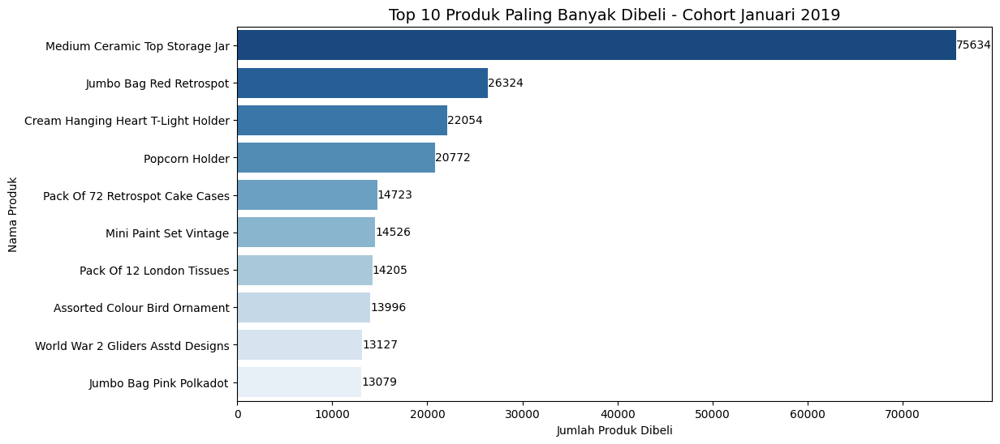

In [109]:
# Exploratory Data
# Menghitung jumlah produk yang dibeli berdasarkan kategori untuk cohort Januari
# 1. Pastikan Date datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# 2. Filter data Jan - Nov 2019
mask = (df_sales['Date'] >= '2019-01-01') & (df_sales['Date'] <= '2019-11-30')
df_2019 = df_sales.loc[mask].copy()

# 3. Buat InvoiceMonth
df_2019['InvoiceMonth'] = df_2019['Date'].dt.to_period('M').dt.to_timestamp()

# 4. Tentukan CohortMonth
df_2019['CohortMonth'] = df_2019.groupby('CustomerNo')['InvoiceMonth'].transform('min')

# 5. Filter cohort Januari 2019
jan_cohort = df_2019[df_2019['CohortMonth'] == pd.Timestamp('2019-01-01')].copy()

# 6. Hitung jumlah produk yang dibeli per kategori (pakai ProductName)
product_counts = (
    jan_cohort.groupby('ProductName')['Quantity']
    .sum()
    .reset_index()
    .sort_values(by='Quantity', ascending=False)
)

# 7. Ambil top 10 kategori produk
top_products = product_counts.head(10)

# 8. Visualisasi barplot dengan angka
plt.figure(figsize=(12,6))
ax = sns.barplot(
    x='Quantity',
    y='ProductName',
    data=top_products,
    palette='Blues_r'
)

plt.title("Top 10 Produk Paling Banyak Dibeli - Cohort Januari 2019", fontsize=14)
plt.xlabel("Jumlah Produk Dibeli")
plt.ylabel("Nama Produk")
plt.grid(False)  # hapus grid

# 5. Tambahkan label angka di ujung bar
for i, v in enumerate(top_products['Quantity']):
    ax.text(v + 5, i, str(v), color='black', va='center')

plt.show()

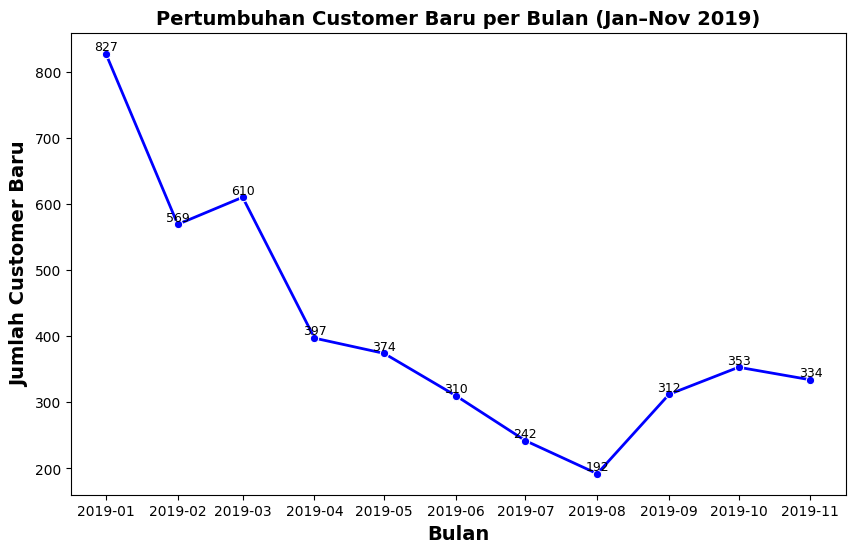

Pertumbuhan Customer Baru per Bulan:
   CohortMonth  NewCustomers
0   2019-01-01           827
1   2019-02-01           569
2   2019-03-01           610
3   2019-04-01           397
4   2019-05-01           374
5   2019-06-01           310
6   2019-07-01           242
7   2019-08-01           192
8   2019-09-01           312
9   2019-10-01           353
10  2019-11-01           334


In [251]:
# Exploratory Data
# Analisis Pertumbuhan Customer Baru
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Hitung customer baru tiap bulan berdasarkan CohortMonth
new_customers = (
    df_2019.groupby('CohortMonth')['CustomerNo']
    .nunique()
    .reset_index()
    .rename(columns={'CustomerNo': 'NewCustomers'})
)

# 2. Visualisasi pertumbuhan customer baru
plt.figure(figsize=(10,6))
sns.lineplot(
    data=new_customers, 
    x='CohortMonth', 
    y='NewCustomers', 
    marker='o', 
    linewidth=2, 
    color='blue'
)

# Tambahkan angka di tiap titik
for i, row in new_customers.iterrows():
    plt.text(row['CohortMonth'], row['NewCustomers']+5, str(row['NewCustomers']), 
             ha='center', fontsize=9)

plt.title("Pertumbuhan Customer Baru per Bulan (Jan–Nov 2019)", fontsize=14, fontweight='bold')
plt.xlabel("Bulan", fontsize=14, fontweight='bold')
plt.ylabel("Jumlah Customer Baru", fontsize=14, fontweight='bold')
plt.grid(False)  # hapus grid
plt.show()

# 3. Cetak data untuk referensi
print("Pertumbuhan Customer Baru per Bulan:")
print(new_customers)


# Time Series Analysis

Time series analysis adalah analisis untuk melihat trend suatu fenomena berdasarkan waktu.

## Pertanyaan 

Pertanyaan 1 :  
Coba totalkan penjualan setiap barang per hari.   
Bagaimana trend penjualan? Apakah ada mengalami kenaikan, penurunan, atau stagnant.

Pertanyaan 2 :  
Lakukan analisis seasonality dengan melihat total order per harinya dari Senin hingga Minggu.  


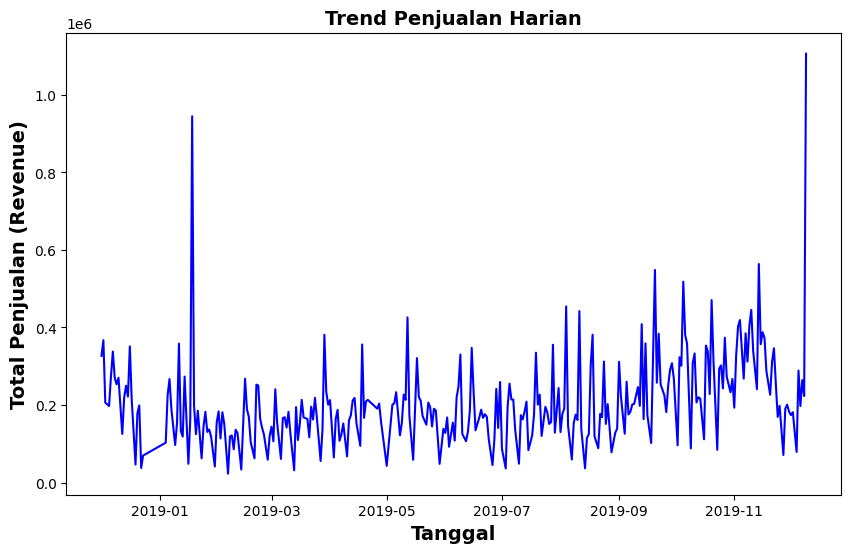

        Date    Revenue
0 2018-12-01  326820.08
1 2018-12-02  367316.62
2 2018-12-03  206313.62
3 2018-12-05  197565.27
4 2018-12-06  273420.10


In [245]:
# Pertanyaan 1: Coba totalkan penjualan setiap barang per hari.Bagaimana trend penjualan? Apakah ada mengalami kenaikan, penurunan, atau stagnant.

# 1. Hitung total penjualan per hari
daily_sales = (
    df_sales.groupby('Date')['Revenue']
    .sum()
    .reset_index()
    .sort_values('Date')
)

# 2. Visualisasi trend penjualan
plt.figure(figsize=(10,6))
sns.lineplot(data=daily_sales, x='Date', y='Revenue', color='blue', linewidth=1.5)

plt.title("Trend Penjualan Harian", fontsize=14, fontweight='bold')
plt.xlabel("Tanggal", fontsize=14, fontweight='bold')
plt.ylabel("Total Penjualan (Revenue)", fontsize=14, fontweight='bold')
plt.grid(False)  # hapus grid
plt.show()

# 3. Tampilkan data head
print(daily_sales.head())

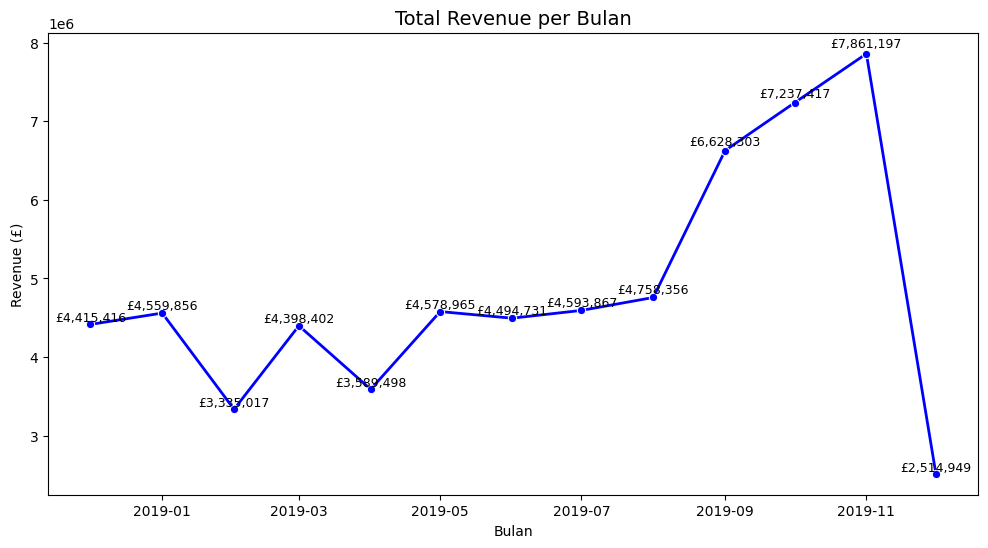

    YearMonth Revenue (£)
0  2018-12-01  £4,415,416
1  2019-01-01  £4,559,856
2  2019-02-01  £3,335,017
3  2019-03-01  £4,398,402
4  2019-04-01  £3,589,498
5  2019-05-01  £4,578,965
6  2019-06-01  £4,494,731
7  2019-07-01  £4,593,867
8  2019-08-01  £4,758,356
9  2019-09-01  £6,628,303
10 2019-10-01  £7,237,417
11 2019-11-01  £7,861,197
12 2019-12-01  £2,514,949


In [115]:
# Exploratory Data
# Total Penjualan Barang per Bulan 
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Pastikan Date sudah datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# 2. Buat kolom bulan
df_sales['YearMonth'] = df_sales['Date'].dt.to_period('M').dt.to_timestamp()

# 3. Hitung total Revenue per bulan
monthly_sales = (
    df_sales.groupby('YearMonth')['Revenue']
    .sum()
    .reset_index()
)

# 4. Visualisasi line chart
plt.figure(figsize=(12,6))
sns.lineplot(
    data=monthly_sales,
    x='YearMonth',
    y='Revenue',
    marker='o',
    linewidth=2,
    color='blue'
)

# Tambahkan angka dengan format £
for i, row in monthly_sales.iterrows():
    plt.text(row['YearMonth'], row['Revenue']+ (row['Revenue']*0.01), 
             f"£{row['Revenue']:,.0f}", ha='center', fontsize=9)

plt.title("Total Revenue per Bulan", fontsize=14)
plt.xlabel("Bulan")
plt.ylabel("Revenue (£)")
plt.grid(False)
plt.show()

# 5. Print data dengan format rapi
monthly_sales['Revenue (£)'] = monthly_sales['Revenue'].apply(lambda x: f"£{x:,.0f}")
print(monthly_sales[['YearMonth','Revenue (£)']])


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2723462363.py:10: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2723462363.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




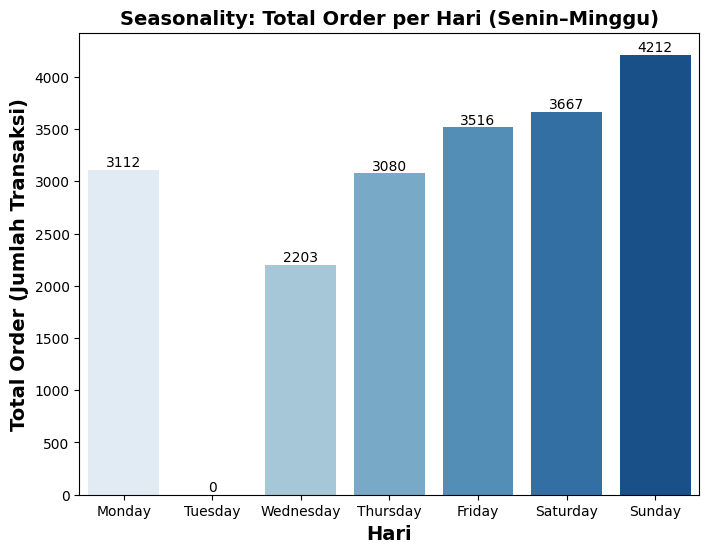

In [253]:
# Pertanyaan 2 : Lakukan analisis seasonality dengan melihat total order per harinya dari Senin hingga Minggu.

# 1. Pastikan Date sudah datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# 2. Tambahkan kolom nama hari
df_sales['DayOfWeekName'] = df_sales['Date'].dt.day_name()

# Hitung total order per hari (unik berdasarkan TransactionNo)
orders_per_day = df_sales.groupby('DayOfWeek')['TransactionNo'].nunique().reset_index()

# Urutkan agar Senin - Minggu
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
orders_per_day['DayOfWeek'] = pd.Categorical(orders_per_day['DayOfWeek'], categories=day_order, ordered=True)
orders_per_day = orders_per_day.sort_values('DayOfWeek')

# Plot
plt.figure(figsize=(8,6))
bars = sns.barplot(x='DayOfWeek', y='TransactionNo', data=orders_per_day, palette='Blues')

# Tambahkan angka di atas bar
for p in bars.patches:
    bars.annotate(f"{int(p.get_height())}", 
                  (p.get_x() + p.get_width() / 2., p.get_height()), 
                  ha='center', va='bottom')

plt.title("Seasonality: Total Order per Hari (Senin–Minggu)", fontsize=14, fontweight='bold')
plt.ylabel("Total Order (Jumlah Transaksi)",  fontsize=14, fontweight='bold')
plt.xlabel("Hari",  fontsize=14, fontweight='bold')
plt.show()



In [220]:
# 5.3 Menampilkan data tren dan seasonality
daily_sales, orders_per_day

(          Date     Revenue
 0   2018-12-01   326820.08
 1   2018-12-02   367316.62
 2   2018-12-03   206313.62
 3   2018-12-05   197565.27
 4   2018-12-06   273420.10
 ..         ...         ...
 300 2019-12-05   289050.50
 301 2019-12-06   197440.51
 302 2019-12-07   264266.66
 303 2019-12-08   223265.49
 304 2019-12-09  1106069.97
 
 [305 rows x 2 columns],
    DayOfWeek  TransactionNo
 0     Monday           3112
 1    Tuesday              0
 2  Wednesday           2203
 3   Thursday           3080
 4     Friday           3516
 5   Saturday           3667
 6     Sunday           4212)

# Price Elasticity

Price sensitivity atau sensitifitas harga mengacu pada perubahan permintaan pelanggan akibat naik atau turunya harga suatu produk.

Pada bagian ini anda akan diminta untuk melakukan analisis terhadap suatu produk yang penjualannya sangat dipengaruhi oleh harga.

## Pertanyaan

Pertanyaan 1 :   
Produk apa yang paling sering mengalami perubahan harga?   
Hitunglah banyaknya harga unik di setiap produk dan ambil daftar produk yang pernah terjual dengan setidaknya 10 variasi harga yang berbeda.

Price Elasticity akan semakin baik dianalisis ketika lebih banyak variasi harga yang muncul.

Pertanyaan 2 :   
Dari semua produk yang terambil dari step 1, hitung lah korelasi antara harga dengan quantity untuk setiap barang.  
Barang manakah yang memiliki korelasi paling negatif?  

Pertanyaan 3 : 
Buatlah scatter plot antara harga dan quantity untuk barang dari soal sebelumnya.  
Apabila produk tersebut mengalami kenaikan harga, kira-kira apa yang akan terjadi dengan penjualan ?

In [119]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- Pastikan data sudah siap ---
# df_sales harus punya kolom: ProductNo, ProductName, Price, Quantity

# Pertanyaan 1:
# Produk apa yang paling sering mengalami perubahan harga?
price_variations = (
    df_sales.groupby(['ProductNo','ProductName'])['Price']
    .nunique()
    .reset_index()
    .rename(columns={'Price':'UniquePriceCount'})
)

# Ambil produk dengan >= 10 variasi harga
products_many_prices = price_variations[price_variations['UniquePriceCount'] >= 10]
print("📊 Produk dengan >=10 variasi harga:")
print(products_many_prices.sort_values('UniquePriceCount', ascending=False))


📊 Produk dengan >=10 variasi harga:
     ProductNo                        ProductName  UniquePriceCount
2791     79321                      Chilli Lights                23
393      21166          Cook With Wine Metal Sign                20
1019     22114  Hot Water Bottle Tea And Sympathy                20
2642     47566                      Party Bunting                19
399      21175      Gin And Tonic Diet Metal Sign                19
...        ...                                ...               ...
3321     85173  Set/6 Frog Prince T-Light Candles                10
61       16218          Cartoon Pencil Sharpeners                10
12       15039                     Sandalwood Fan                10
3328    85179C             Pink Bitty Light Chain                10
3348    85199S  Small Hanging Ivory/Red Wood Bird                10

[700 rows x 3 columns]


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\897789966.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


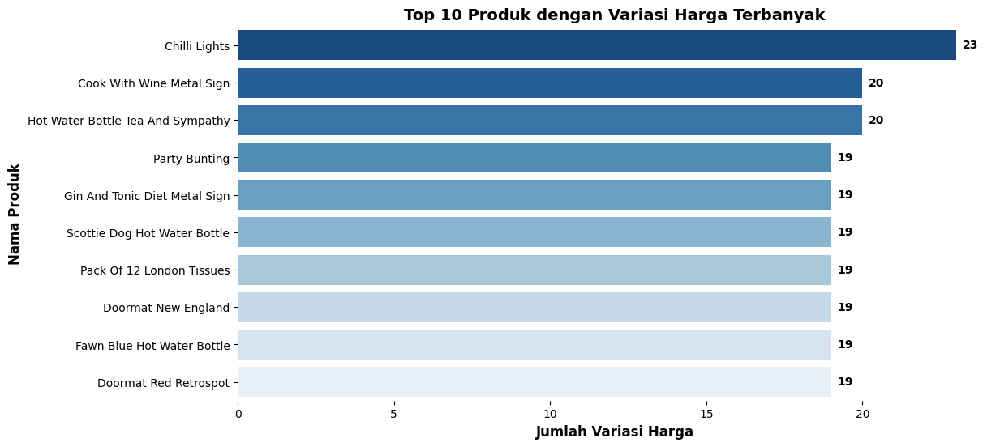

In [121]:
# Visualisasi produk dengan variasi harga terbanyak
import matplotlib.pyplot as plt
import seaborn as sns

# Ambil top 10 produk dengan variasi harga terbanyak
top10_products = (
    products_many_prices
    .sort_values('UniquePriceCount', ascending=False)
    .head(10)
)

plt.figure(figsize=(12,6))
sns.barplot(
    data=top10_products,
    x='UniquePriceCount',
    y='ProductName',
    palette="Blues_r"
)

# Tambahkan label angka di bar
for i, v in enumerate(top10_products['UniquePriceCount']):
    plt.text(v + 0.2, i, str(v), va='center', fontsize=10, fontweight='bold')

# Styling
plt.title("Top 10 Produk dengan Variasi Harga Terbanyak", fontsize=14, fontweight='bold')
plt.xlabel("Jumlah Variasi Harga", fontsize=12, fontweight='bold')
plt.ylabel("Nama Produk", fontsize=12, fontweight='bold')
sns.despine(left=True, bottom=True)  # hilangkan grid dan spines tambahan
plt.grid(False)

plt.show()


📉 Produk dengan korelasi harga-quantity paling negatif:
ProductNo                                   22124
ProductName    Set Of 2 Tea Towels Ping Microwave
Correlation                             -0.477738
Name: 212, dtype: object
📉 Top 10 produk dengan korelasi harga-quantity paling negatif:
                             ProductName  Correlation
212   Set Of 2 Tea Towels Ping Microwave    -0.477738
435  Squarecushion Cover Pink Union Jack    -0.461947
49           Large Cake Towel Pink Spots    -0.439484
114              Bag 500g Swirly Marbles    -0.436841
200                   Pizza Plate In Box    -0.436719
590        Multicolour Spring Flower Mug    -0.411175
242            T-Light Holder White Lace    -0.392285
50      Swiss Roll Towel Chocolate Spots    -0.377746
259            Home Garland Painted Zinc    -0.351573
300            Pin Cushion Babushka Pink    -0.346574


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2589953639.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


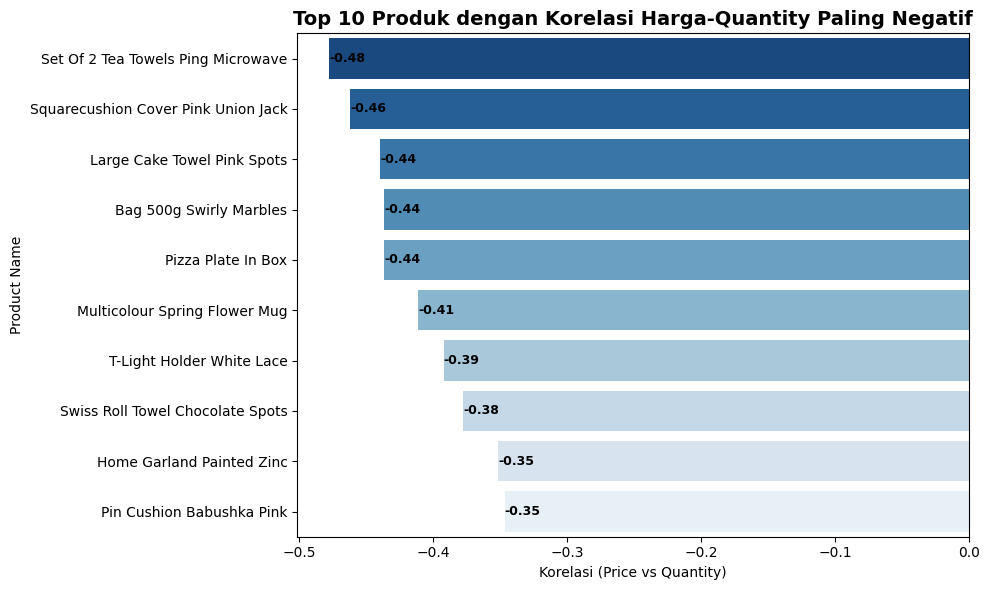

In [129]:
# Pertanyaan 2:
# 1. Hitung korelasi harga vs quantity untuk produk dengan variasi harga
correlation_list = []

for pid in products_many_prices['ProductNo']:
    sub = df_sales[df_sales['ProductNo'] == pid]
    if sub['Price'].nunique() > 1:  # pastikan ada variasi harga
        corr = sub['Price'].corr(sub['Quantity'])
        correlation_list.append((pid, sub['ProductName'].iloc[0], corr))

corr_df = pd.DataFrame(correlation_list, columns=['ProductNo','ProductName','Correlation'])

# Cari produk dengan korelasi paling negatif
most_negative = corr_df.sort_values('Correlation').iloc[0]
print("\n📉 Produk dengan korelasi harga-quantity paling negatif:")
print(most_negative)


# 2. Visualisasi produk dengan variasi harga terbanyak
# Top 10 Produk dengan Korelasi Harga-Quantity Paling Negatif
top10_negative = corr_df.sort_values('Correlation').head(10)
print("📉 Top 10 produk dengan korelasi harga-quantity paling negatif:")
print(top10_negative[['ProductName','Correlation']])

# --- Visualisasi ---
plt.figure(figsize=(10,6))
sns.barplot(
    data=top10_negative,
    x="Correlation", 
    y="ProductName",
    palette="Blues_r"
)

plt.title("Top 10 Produk dengan Korelasi Harga-Quantity Paling Negatif", fontsize=14, weight='bold')
plt.xlabel("Korelasi (Price vs Quantity)")
plt.ylabel("Product Name")

# Tambahkan label angka di bar
for i, v in enumerate(top10_negative['Correlation']):
    plt.text(v, i, f"{v:.2f}", va='center', fontsize=9, weight='bold')

plt.tight_layout()
plt.show()


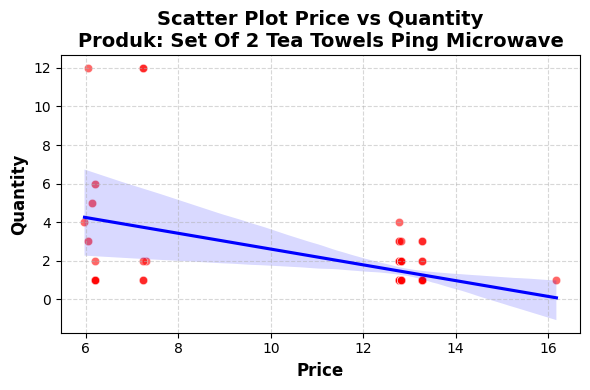

In [297]:
# Pertanyaan 3:
# Scatter plot harga vs quantity untuk produk paling sensitif
# Scatter plot harga vs quantity untuk produk paling sensitif (korelasi negatif terkuat)

# Ambil produk dengan korelasi paling negatif
most_sensitive_product = most_negative['ProductName']

# Filter data untuk produk tersebut
product_data = df_sales[df_sales['ProductName'] == most_sensitive_product]

plt.figure(figsize=(6,4))
sns.scatterplot(data=product_data, x='Price', y='Quantity', alpha=0.6, color='red')

plt.title(f"Scatter Plot Price vs Quantity\nProduk: {most_sensitive_product}", fontsize=14, weight='bold')
plt.xlabel("Price", fontsize=12, weight='bold')
plt.ylabel("Quantity", fontsize=12, weight='bold')
plt.grid(True, linestyle='--', alpha=0.5) 

# Tambahkan garis tren (regresi linier)
sns.regplot(data=product_data, x='Price', y='Quantity', scatter=False, color='blue')

plt.tight_layout()
plt.show()


# Insight:

📊 Top 10 produk dengan variasi harga terbanyak:
                            ProductName  UniquePriceCount
2791                      Chilli Lights                23
393           Cook With Wine Metal Sign                20
1019  Hot Water Bottle Tea And Sympathy                20
2642                      Party Bunting                19
399       Gin And Tonic Diet Metal Sign                19
1016       Scottie Dog Hot Water Bottle                19
1477          Pack Of 12 London Tissues                19
2670                Doormat New England                19
604          Fawn Blue Hot Water Bottle                19
144               Doormat Red Retrospot                19


C:\Users\lenovo\anaconda3\envs\growia\lib\site-packages\numpy\lib\_function_base_impl.py:2922: RuntimeWarning:

invalid value encountered in divide

C:\Users\lenovo\anaconda3\envs\growia\lib\site-packages\numpy\lib\_function_base_impl.py:2923: RuntimeWarning:

invalid value encountered in divide



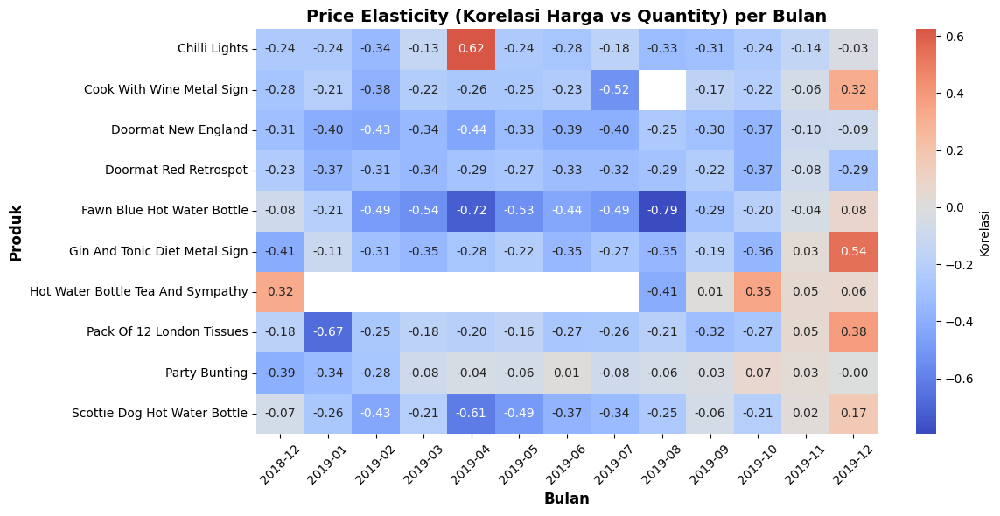

In [200]:
# Mencari presentase kategori elastisitas harga per bulan
# --- Pastikan kolom Date datetime ---
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# Tambahkan kolom bulan (format YYYY-MM)
df_sales['Month'] = df_sales['Date'].dt.to_period('M')

# Hitung Revenue (opsional)
df_sales['Revenue'] = df_sales['Quantity'] * df_sales['Price']

# STEP 1: Cari produk dengan variasi harga terbanyak
price_variations = (
    df_sales.groupby(['ProductNo','ProductName'])['Price']
    .nunique()
    .reset_index()
    .rename(columns={'Price':'UniquePriceCount'})
)

# Produk dengan variasi harga >= 10
products_many_prices = price_variations[price_variations['UniquePriceCount'] >= 10]

# Ambil Top 10
top10_varied = products_many_prices.sort_values('UniquePriceCount', ascending=False).head(10)
print("📊 Top 10 produk dengan variasi harga terbanyak:")
print(top10_varied[['ProductName','UniquePriceCount']])

# STEP 2: Hitung korelasi harga vs quantity per bulan
df_top_products = df_sales[df_sales['ProductName'].isin(top10_varied['ProductName'])]

monthly_corr = []

for product in df_top_products['ProductName'].unique():
    for month, group in df_top_products[df_top_products['ProductName']==product].groupby('Month'):
        if len(group['Price'].unique()) > 1:  # hanya bulan dengan variasi harga
            corr = group['Price'].corr(group['Quantity'])
            monthly_corr.append({
                'ProductName': product,
                'Month': str(month),  # ubah jadi string agar rapi di heatmap
                'Price_Quantity_Corr': corr
            })

monthly_corr_df = pd.DataFrame(monthly_corr)

# STEP 3: Visualisasi Heatmap
corr_matrix = monthly_corr_df.pivot(index='ProductName', columns='Month', values='Price_Quantity_Corr')

plt.figure(figsize=(12,6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0, cbar_kws={'label':'Korelasi'})
plt.title("Price Elasticity (Korelasi Harga vs Quantity) per Bulan", fontsize=14, fontweight='bold')
plt.xlabel("Bulan", fontsize=12, fontweight='bold')
plt.ylabel("Produk", fontsize=12, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

 # STEP 4: Kesimpulan Otomatis
summary = {}

for product in monthly_corr_df['ProductName'].unique():
    sub = monthly_corr_df[monthly_corr_df['ProductName'] == product]
    avg_corr = sub['Price_Quantity_Corr'].mean()
    min_corr = sub['Price_Quantity_Corr'].min()
    max_corr = sub['Price_Quantity_Corr'].max()

    if avg_corr < -0.3:
        label = "Elastis (sensitif terhadap harga, korelasi negatif)"
    elif avg_corr > 0.3:
        label = "Inelastis (cenderung tidak sensitif, bahkan korelasi positif)"
    else:
        label = "Netral (korelasi lemah)"

    summary[product] = {
        "Rata-rata Korelasi": round(avg_corr, 2),
        "Korelasi Tertinggi": round(max_corr, 2),
        "Korelasi Terendah": round(min_corr, 2),
        "Kategori": label
    }

# Insight Price Elasticity per Produk:

# Basket Size Analysis

Ketika seorang pelanggan e-commerce menekan "add to cart", maka barang tersebut akan disimpan dalam sebuah "basket".  
Ketika melakukan checkout, maka semua barang dalam basket tersebut akan diproses dan dikirimkan.  
Ukuran dari basket dapat diukur melalui nilai GMV (Gross merchandise volume) yang merupakan total harga barang yang dibeli.  
Contoh : 
Pada tanggal 1 januari 2012
Tuan A membeli 1 shampoo seharga 15ribu dan 2 sabun seharga 20ribu masing-masing. Maka basket size tuan A adalah 55ribu rupiah.
Nyonya B hanya membeli 1 cemilan seharga 20 ribu, maka basket size dari nyonya B adalah 20 ribu rupiah.
Berarti total GMV ecommerce pada 1 januari 2012 adalah 75ribu rupiah, dengan rata-rata basket size sebesar 37.5 ribu rupiah per basket.

## Pertanyaan
1. Hitung rata-rata basket size dari seluruh transaksi per harinya, apakah konsisten atau ada perubahan ?
2. Apakah ada perbedaan ukuran basket dari negara yang berbeda ?

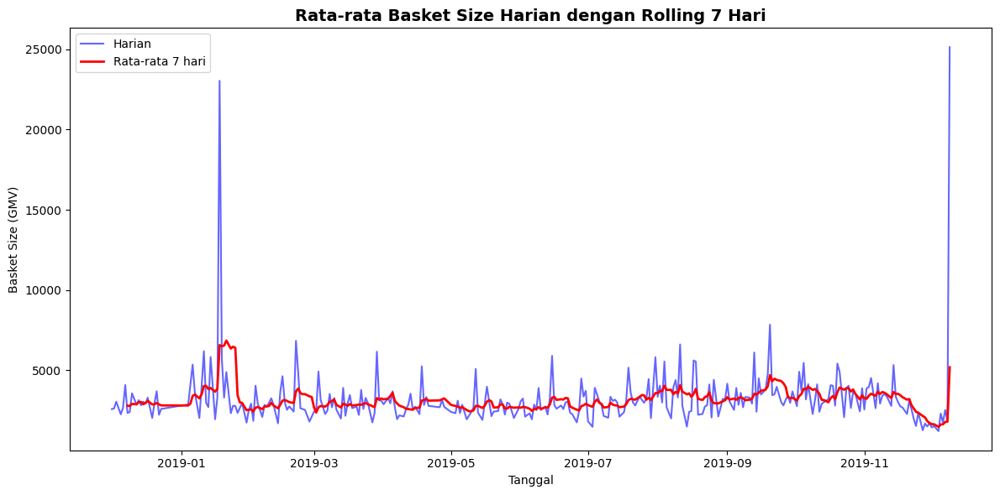

In [139]:
# Pertanyaan 1: Hitung rata-rata basket size dari seluruh transaksi per harinya, apakah konsisten atau ada perubahan ?

# --- Pastikan Date dalam format datetime ---
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# --- Hitung GMV (Gross Merchandise Volume) ---
df_sales['GMV'] = df_sales['Quantity'] * df_sales['Price']

# Pertanyaan 1: Rata-rata basket size per hari

# Hitung basket size = GMV per transaksi
basket_daily = (
    df_sales.groupby(['Date','TransactionNo'])
    .agg({'GMV':'sum'})
    .reset_index()
)

# Hitung rata-rata basket size per hari
avg_basket_daily = basket_daily.groupby('Date')['GMV'].mean().reset_index()

# Visualisasi tren rata-rata basket size harian (tanpa grid)
# Visualisasi tren rata-rata basket size harian (biru)
avg_basket_daily['rolling_7d'] = avg_basket_daily['GMV'].rolling(7).mean()

plt.figure(figsize=(12,6))
plt.plot(avg_basket_daily['Date'], avg_basket_daily['GMV'], 
         color="blue", alpha=0.6, label="Harian")
plt.plot(avg_basket_daily['Date'], avg_basket_daily['rolling_7d'], 
         color="red", linewidth=2, label="Rata-rata 7 hari")

plt.title("Rata-rata Basket Size Harian dengan Rolling 7 Hari", fontsize=14, weight="bold")
plt.xlabel("Tanggal")
plt.ylabel("Basket Size (GMV)")
plt.legend()
plt.grid(False)
plt.tight_layout()
plt.show()



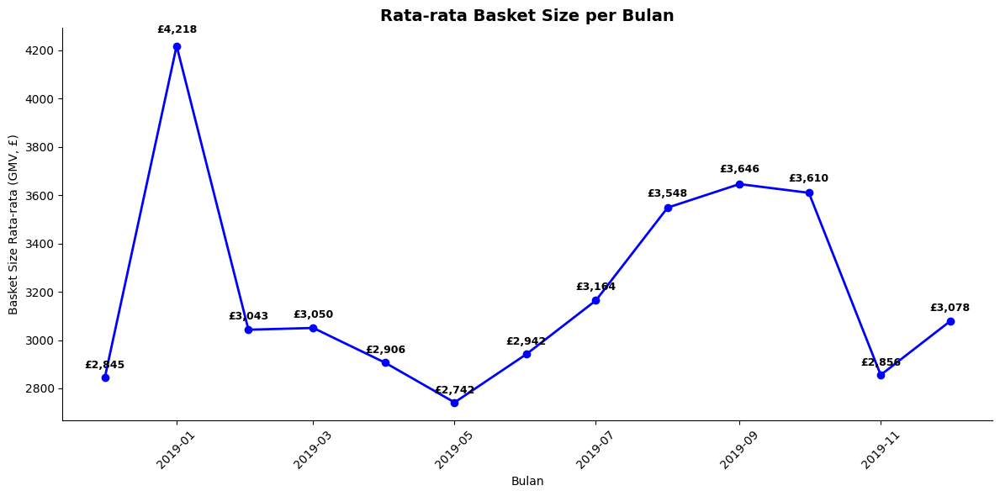

In [141]:
# Exploratory Data
# Rata-rata Basket Size per bulan 

# Hitung GMV (jika belum ada)
df_sales['GMV'] = df_sales['Quantity'] * df_sales['Price']

# Basket size per transaksi
basket_tx = (
    df_sales.groupby(['TransactionNo', 'Date'])
    .agg({'GMV':'sum'})
    .reset_index()
)

# Buat kolom bulan
basket_tx['Month'] = basket_tx['Date'].dt.to_period('M').dt.to_timestamp()

# Hitung rata-rata basket size per bulan
avg_basket_month = basket_tx.groupby('Month')['GMV'].mean().reset_index()

# Visualisasi line chart dengan angka
plt.figure(figsize=(12,6))
plt.plot(avg_basket_month['Month'], avg_basket_month['GMV'], marker='o', color="blue", linewidth=2)

# Tambahkan angka di atas titik
for i, val in enumerate(avg_basket_month['GMV']):
    plt.text(avg_basket_month['Month'].iloc[i], val + (val*0.01), f"£{val:,.0f}", 
             ha='center', va='bottom', fontsize=9, fontweight='bold')

# Styling
plt.title("Rata-rata Basket Size per Bulan", fontsize=14, fontweight='bold')
plt.xlabel("Bulan")
plt.ylabel("Basket Size Rata-rata (GMV, £)")
plt.xticks(rotation=45)
sns.despine()
plt.tight_layout()
plt.grid(False)
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\3088654549.py:21: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




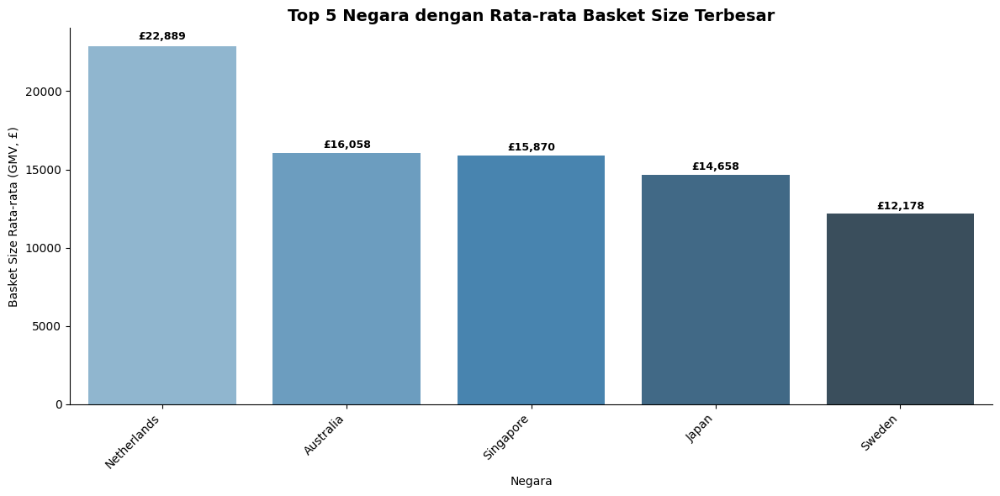

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\3088654549.py:55: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




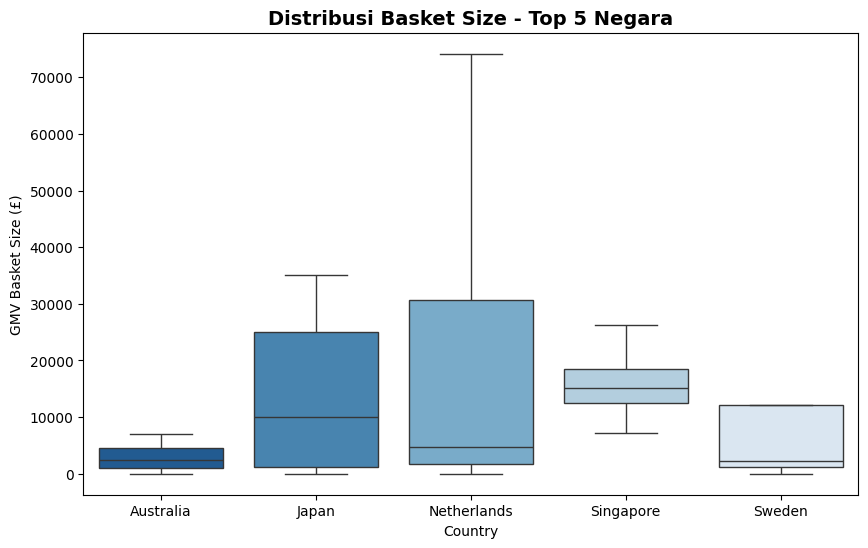

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\3088654549.py:69: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




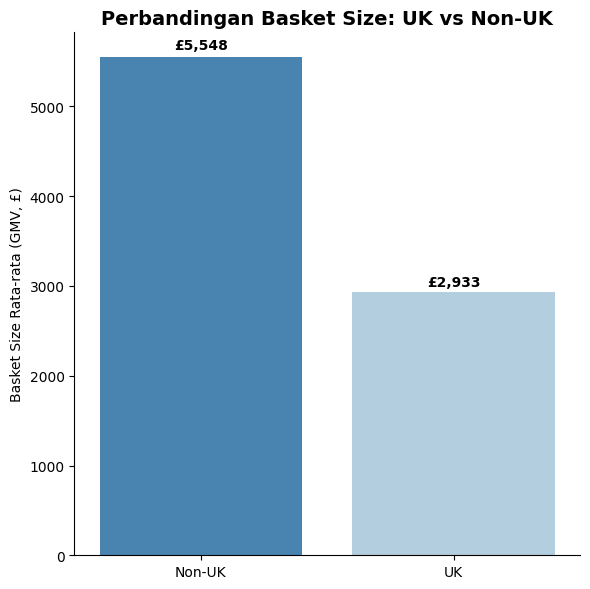

In [215]:
# Pertanyaan 2: Apakah ada perbedaan ukuran basket dari negara yang berbeda ?

# Hitung basket size per transaksi per negara
basket_country = (
    df_sales.groupby(['Country','TransactionNo'])
    .agg({'GMV':'sum'})
    .reset_index()
)

# Versi 1: Top 5 Negara
avg_basket_country = (
    basket_country.groupby('Country')['GMV']
    .mean()
    .reset_index()
    .sort_values('GMV', ascending=False)
    .head(5)
)

# Visualisasi bar chart
plt.figure(figsize=(12,6))
ax = sns.barplot(
    data=avg_basket_country,
    x='Country', y='GMV',
    palette="Blues_d"
)

# Tambahkan angka di atas bar
for i, val in enumerate(avg_basket_country['GMV']):
    ax.text(i, val + (val*0.01), f"£{val:,.0f}", ha='center', va='bottom', fontsize=9, fontweight='bold')

# Styling
plt.title("Top 5 Negara dengan Rata-rata Basket Size Terbesar", fontsize=14, fontweight='bold')
plt.xlabel("Negara")
plt.ylabel("Basket Size Rata-rata (GMV, £)")
plt.xticks(rotation=45, ha='right')
sns.despine()
plt.tight_layout()
plt.show()

# DIstribusi Basket Size
# Ambil Top 5 negara berdasarkan rata-rata basket size
top5_countries = (
    basket_country.groupby('Country')['GMV']
    .mean()
    .sort_values(ascending=False)
    .head(5)
    .index
)

# Filter hanya Top 5
basket_top5 = basket_country[basket_country['Country'].isin(top5_countries)]

# Boxplot Top 5
plt.figure(figsize=(10,6))
sns.boxplot(data=basket_top5, x='Country', y='GMV', showfliers=False, palette="Blues_r")
plt.title("Distribusi Basket Size - Top 5 Negara", fontsize=14, fontweight='bold')
plt.ylabel("GMV Basket Size (£)")
plt.xlabel("Country")
plt.show()


# Versi 2: Perbandingan UK vs Non-UK
basket_country['is_UK'] = basket_country['Country'].apply(lambda x: 'UK' if x == 'United Kingdom' else 'Non-UK')

compare = basket_country.groupby('is_UK')['GMV'].mean().reset_index()

# Visualisasi perbandingan UK vs Non-UK
plt.figure(figsize=(6,6))
ax = sns.barplot(data=compare, x='is_UK', y='GMV', palette="Blues_r")

# Tambahkan angka
for i, val in enumerate(compare['GMV']):
    ax.text(i, val + (val*0.01), f"£{val:,.0f}", ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.title("Perbandingan Basket Size: UK vs Non-UK", fontsize=14, fontweight='bold')
plt.xlabel("")
plt.ylabel("Basket Size Rata-rata (GMV, £)")
sns.despine()
plt.tight_layout()
plt.show()


           Country  TotalTransactions
36  United Kingdom              17908
14         Germany                453
13          France                404
10            EIRE                277
3          Belgium                 97
24     Netherlands                 94
31           Spain                 78
0        Australia                 62
33     Switzerland                 55
27        Portugal                 52


C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\2808322787.py:18: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=top10_country_tx, x='Country', y='TotalTransactions', palette="Blues_r")


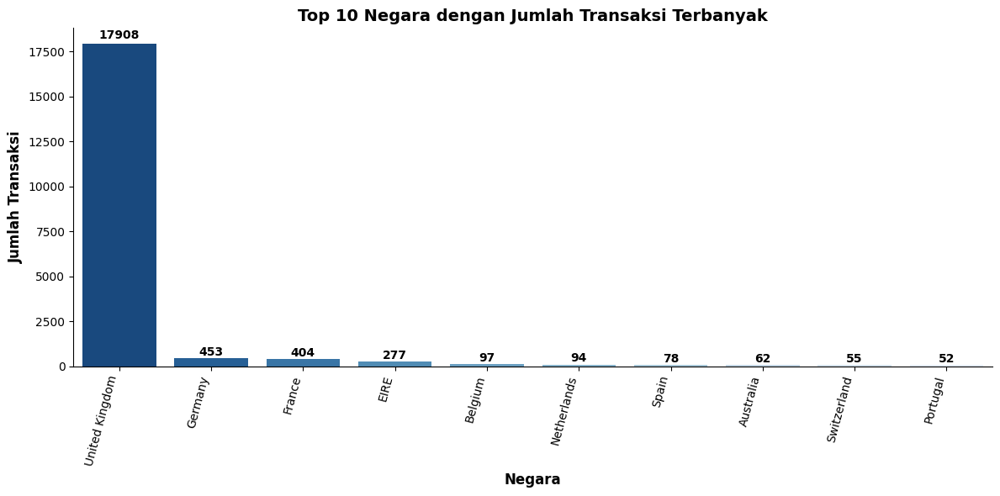

In [147]:
# Exploratory Data 
# Negara dengan Jumlah Transaksi terbanyak
# Hitung jumlah transaksi per negara
transactions_country = (
    df_sales.groupby('Country')['TransactionNo']
    .nunique()
    .reset_index()
    .rename(columns={'TransactionNo':'TotalTransactions'})
    .sort_values('TotalTransactions', ascending=False)
)

# Tampilkan top 10 negara
top10_country_tx = transactions_country.head(10)
print(top10_country_tx)

# Visualisasi barplot
plt.figure(figsize=(12,6))
sns.barplot(data=top10_country_tx, x='Country', y='TotalTransactions', palette="Blues_r")

# Tambahkan angka di atas bar
for i, val in enumerate(top10_country_tx['TotalTransactions']):
    plt.text(i, val + (val*0.01), str(val), ha='center', va='bottom', fontsize=10, fontweight='bold')

# Styling
plt.title("Top 10 Negara dengan Jumlah Transaksi Terbanyak", fontsize=14, fontweight='bold')
plt.xlabel("Negara", fontsize=12, fontweight='bold')
plt.ylabel("Jumlah Transaksi", fontsize=12, fontweight='bold')
plt.xticks(rotation=75, ha='right')
sns.despine()
plt.tight_layout()
plt.grid(False)
plt.show()

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\1298579705.py:21: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


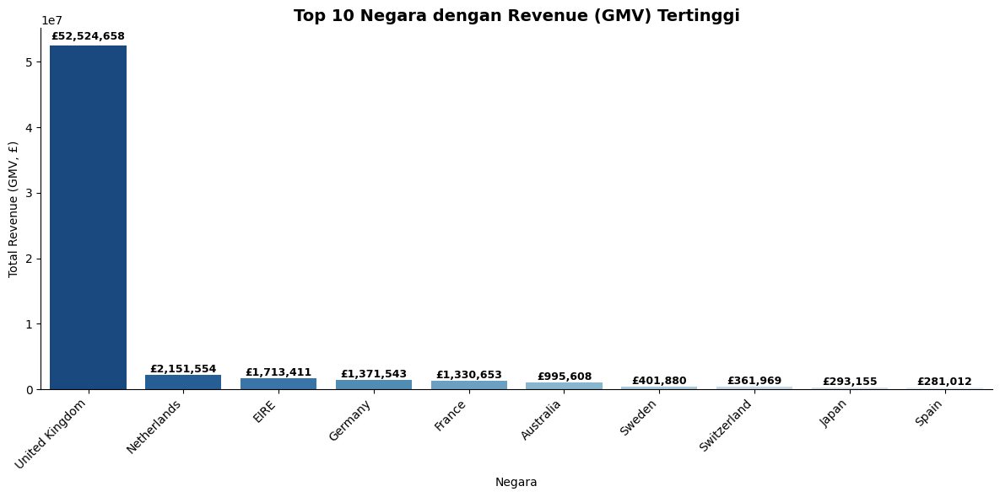

In [149]:
# Exploratory Data
# Negara dengan jumlah revenue tertinggi

# Hitung Total Revenue (GMV) per Negara
revenue_country = (
    df_sales.groupby('Country')['GMV']
    .sum()
    .reset_index()
    .sort_values('GMV', ascending=False)
)

# Ambil Top 10 negara dengan revenue tertinggi
top10_revenue_country = revenue_country.head(10)

# Visualisasi Top 10 Negara dengan Revenue Tertinggi
plt.figure(figsize=(12,6))
ax = sns.barplot(
    data=top10_revenue_country,
    x='Country', y='GMV',
    palette="Blues_r"
)

# Tambahkan angka di atas bar
for i, val in enumerate(top10_revenue_country['GMV']):
    ax.text(i, val + (val*0.01), f"£{val:,.0f}", 
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# Styling
plt.title("Top 10 Negara dengan Revenue (GMV) Tertinggi", fontsize=14, fontweight='bold')
plt.xlabel("Negara")
plt.ylabel("Total Revenue (GMV, £)")
plt.xticks(rotation=45, ha='right')
sns.despine()
plt.tight_layout()
plt.grid (False)
plt.show()


In [151]:
import plotly.express as px

# --- Hitung Total Revenue per Negara ---
revenue_country = (
    df_sales.groupby('Country')['GMV']
    .sum()
    .reset_index()
    .sort_values('GMV', ascending=False)
)

# --- Rapikan Outlier: batasi ke 95th percentile ---
q95 = revenue_country['GMV'].quantile(0.95)
revenue_country['GMV_clipped'] = revenue_country['GMV'].clip(upper=q95)

# --- Visualisasi Maps ---
fig = px.choropleth(
    revenue_country,
    locations="Country",
    locationmode="country names",   # pakai nama negara langsung
    color="GMV_clipped",            # pakai revenue clipped
    hover_name="Country",
    hover_data={"GMV":":,.0f"},     # tampilkan revenue asli di hover
    color_continuous_scale="Viridis"
)

fig.update_layout(
    title="Total Revenue (GMV) per Negara<br><sup>(Outlier dirampingkan ke 95th percentile)</sup>",
    title_x=0.5,
    geo=dict(showframe=False, showcoastlines=True, projection_type="natural earth")
)

fig.show()


# Crucial Question:
1. How was the sales trend over the months?
2. What are the most frequently purchased products?
3. How many products does the customer purchase in each transaction?
4. What are the most profitable segment customers?
5. Based on your findings, what strategy could you recommend to the business to gain more profit?

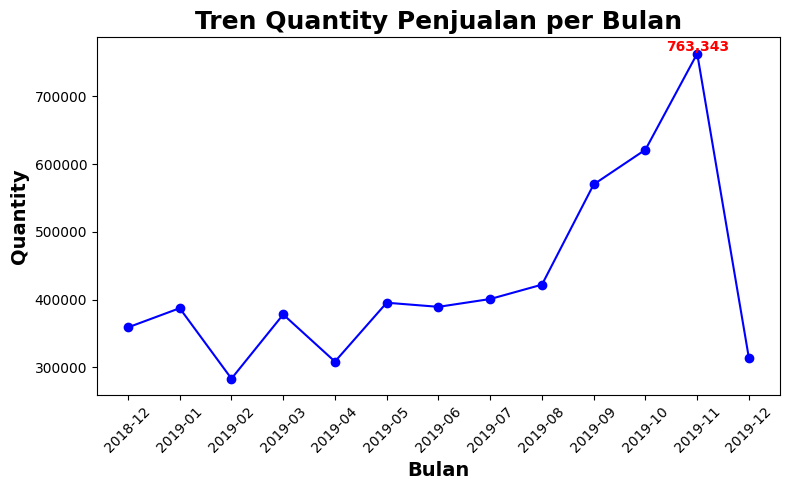

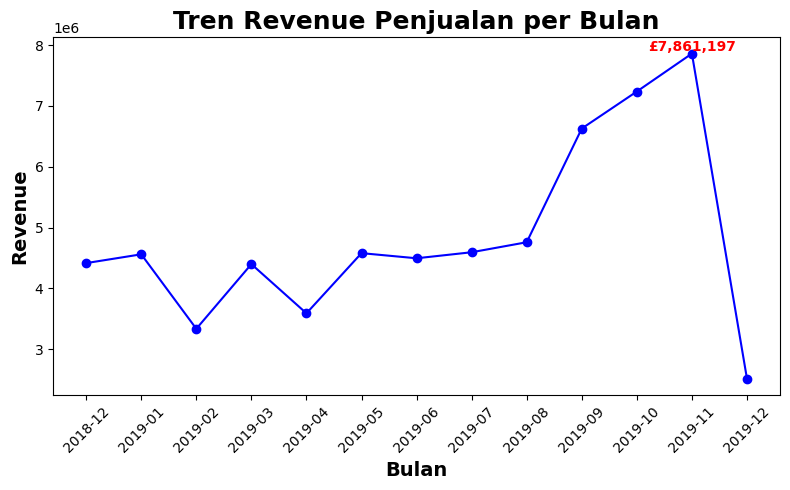

In [237]:
# Pertanyaan 1: How was the sales trend over the months?
import matplotlib.pyplot as plt

# Pastikan kolom Date sudah datetime
df_sales['Date'] = pd.to_datetime(df_sales['Date'], errors='coerce')

# Ambil bulan
df_sales['Month'] = df_sales['Date'].dt.to_period('M')

# Hitung total Quantity dan Revenue per bulan
monthly_summary = df_sales.groupby('Month').agg({
    'Quantity': 'sum',
    'Revenue': lambda x: (x if 'Revenue' in df_sales.columns else df_sales['Quantity']*df_sales['Price']).sum()
}).reset_index()

# --- Visualisasi Quantity ---
plt.figure(figsize=(8,5))
plt.plot(monthly_summary['Month'].astype(str), monthly_summary['Quantity'], marker='o', color='blue')
plt.title("Tren Quantity Penjualan per Bulan", fontsize=18, fontweight='bold')
plt.xlabel("Bulan", fontsize=14, fontweight='bold')
plt.ylabel("Quantity", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)

# Anotasi hanya untuk nilai tertinggi
max_idx = monthly_summary['Quantity'].idxmax()
plt.text(
    x=max_idx,
    y=monthly_summary['Quantity'].max(),
    s=f"{monthly_summary['Quantity'].max():,}",
    ha='center', va='bottom', fontsize=10, fontweight='bold', color="red"
)

plt.tight_layout()
plt.show()

# --- Visualisasi Revenue ---
plt.figure(figsize=(8,5))
plt.plot(monthly_summary['Month'].astype(str), monthly_summary['Revenue'], marker='o', color='blue')
plt.title("Tren Revenue Penjualan per Bulan", fontsize=18, fontweight='bold')
plt.xlabel("Bulan", fontsize=14, fontweight='bold')
plt.ylabel("Revenue", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)

# Anotasi hanya untuk nilai tertinggi
max_idx = monthly_summary['Revenue'].idxmax()
plt.text(
    x=max_idx,
    y=monthly_summary['Revenue'].max(),
    s=f"£{monthly_summary['Revenue'].max():,.0f}",
    ha='center', va='bottom', fontsize=10, fontweight='bold', color="red"
)

plt.tight_layout()
plt.show()


# Insight Tren Penjualan:

C:\Users\lenovo\AppData\Local\Temp\ipykernel_16276\1562574709.py:19: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




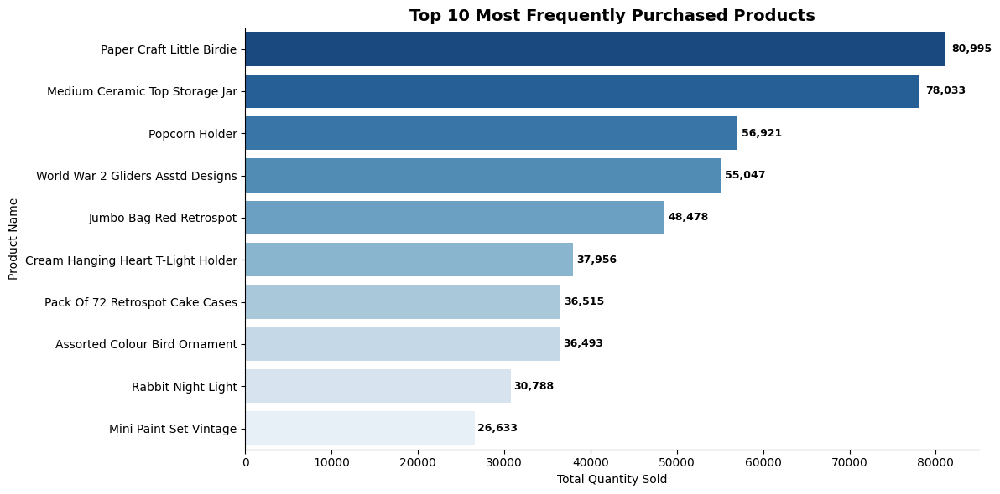

                             ProductName  Quantity
2203           Paper Craft Little Birdie     80995
1887      Medium Ceramic Top Storage Jar     78033
2481                      Popcorn Holder     56921
3670   World War 2 Gliders Asstd Designs     55047
1672             Jumbo Bag Red Retrospot     48478
825   Cream Hanging Heart T-Light Holder     37956
2157     Pack Of 72 Retrospot Cake Cases     36515
203        Assorted Colour Bird Ornament     36493
2540                  Rabbit Night Light     30788
1938              Mini Paint Set Vintage     26633


In [167]:
# Pertanyaan 2: What are the most frequently purchased products?
# Hitung total quantity per produk
product_quantity = (
    df_sales.groupby('ProductName')['Quantity']
    .sum()
    .reset_index()
    .sort_values('Quantity', ascending=False)
)

# Ambil Top 10 produk paling sering dibeli
top10_products = product_quantity.head(10)

# Visualisasi Top 10 Produk
plt.figure(figsize=(12,6))
ax = sns.barplot(
    data=top10_products,
    x='Quantity', y='ProductName',
    palette="Blues_r"
)

# Tambahkan angka di bar
for i, val in enumerate(top10_products['Quantity']):
    ax.text(val + (val*0.01), i, f"{val:,}", va='center', fontsize=9, fontweight='bold')

# Styling
plt.title("Top 10 Most Frequently Purchased Products", fontsize=14, fontweight='bold')
plt.xlabel("Total Quantity Sold")
plt.ylabel("Product Name")
sns.despine()
plt.tight_layout()
plt.show()

# Tampilkan tabel ringkas
print(top10_products)


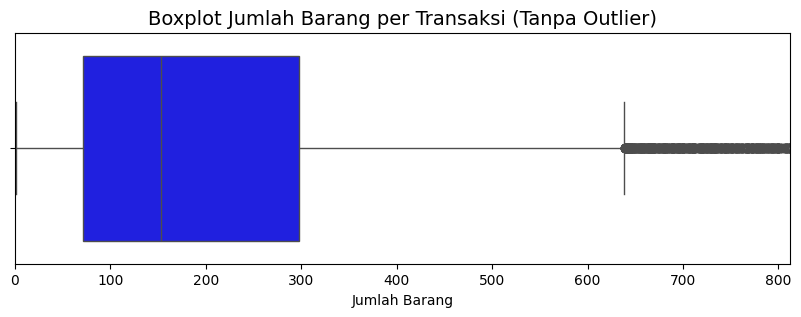

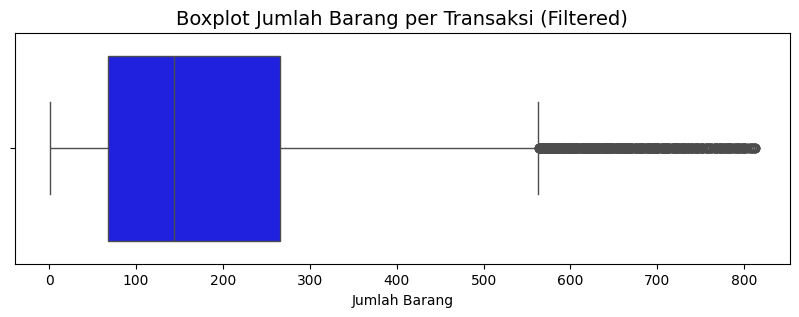

In [171]:
# Pertanyaan 3: How many products does the customer purchase in each transaction?
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan Quantity numerik
df_sales['Quantity'] = pd.to_numeric(df_sales['Quantity'], errors='coerce')

# --- Hitung basket size per transaksi ---
basket_quantity = df_sales.groupby('TransactionNo')['Quantity'].sum()
unique_products = df_sales.groupby('TransactionNo')['ProductName'].nunique()

# --- Visualisasi Boxplot horizontal jumlah barang per transaksi ---
plt.figure(figsize=(10,3))
sns.boxplot(x=basket_quantity, color='Blue', orient='h')

# Batasi tampilan hanya sampai 95th percentile
plt.xlim(0, basket_quantity.quantile(0.95))

plt.title("Boxplot Jumlah Barang per Transaksi (Tanpa Outlier)", fontsize=14)
plt.xlabel("Jumlah Barang")
plt.show()

# Filter hanya transaksi <= 95th percentile
filtered_basket = basket_quantity[basket_quantity <= basket_quantity.quantile(0.95)]

plt.figure(figsize=(10,3))
sns.boxplot(x=filtered_basket, color='Blue', orient='h')
plt.title("Boxplot Jumlah Barang per Transaksi (Filtered)", fontsize=14)
plt.xlabel("Jumlah Barang")
plt.show()



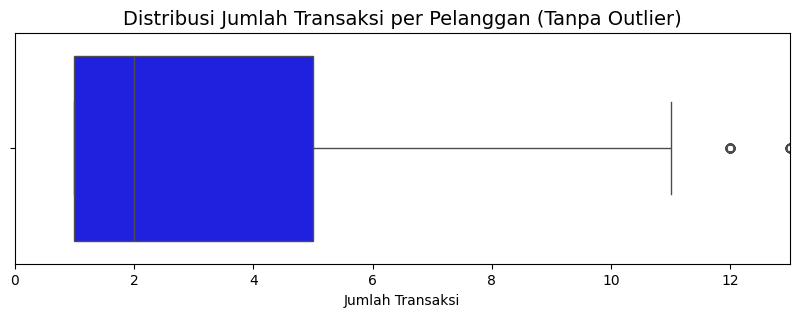

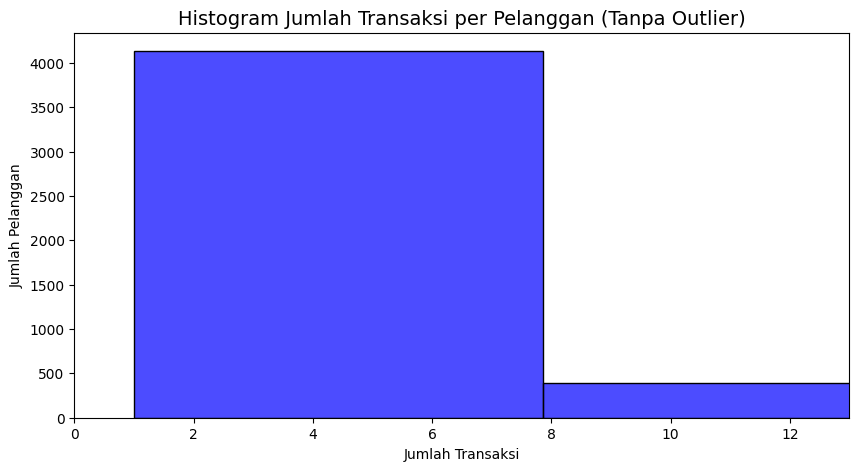

count    4719.000000
mean        4.193685
std         7.395463
min         1.000000
25%         1.000000
50%         2.000000
75%         5.000000
max       207.000000
Name: TotalTransactions, dtype: float64


In [173]:
# Distribusi Jumlah  Transaksi per Pelanggan
# Pastikan kolom CustomerID ada
df_sales['CustomerNo'] = pd.to_numeric(df_sales['CustomerNo'], errors='coerce')

# Hitung jumlah transaksi per pelanggan
transactions_per_customer = (
    df_sales.groupby('CustomerNo')['TransactionNo']
    .nunique()   # hitung transaksi unik per pelanggan
    .reset_index(name='TotalTransactions')
)

# =====================================================
# Boxplot dengan Outlier Dirampingkan (pakai quantile)
# =====================================================
plt.figure(figsize=(10,3))
sns.boxplot(
    x=transactions_per_customer['TotalTransactions'], 
    color='blue', orient='h'
)

# Batasi tampilan ke 95th percentile agar lebih rapi
plt.xlim(0, transactions_per_customer['TotalTransactions'].quantile(0.95))

plt.title("Distribusi Jumlah Transaksi per Pelanggan (Tanpa Outlier)", fontsize=14)
plt.xlabel("Jumlah Transaksi")
plt.show()

# =====================================================
# Histogram untuk lihat distribusi frekuensi
# =====================================================
plt.figure(figsize=(10,5))
sns.histplot(
    transactions_per_customer['TotalTransactions'], 
    bins=30, color="blue", alpha=0.7
)
plt.xlim(0, transactions_per_customer['TotalTransactions'].quantile(0.95))  # fokus ke mayoritas
plt.title("Histogram Jumlah Transaksi per Pelanggan (Tanpa Outlier)", fontsize=14)
plt.xlabel("Jumlah Transaksi")
plt.ylabel("Jumlah Pelanggan")
plt.grid(False)
plt.show()

# Statistik ringkas
print(transactions_per_customer['TotalTransactions'].describe())


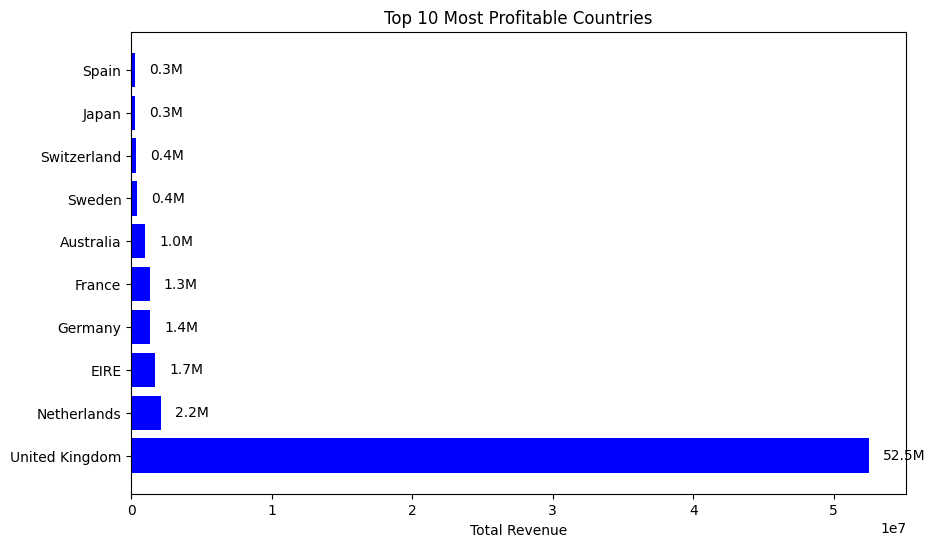

In [175]:
# Pertanyaan 4: What are the most profitable segment customers?
import matplotlib.pyplot as plt

# Pastikan ada kolom Revenue
df_sales['Revenue'] = df_sales['Quantity'] * df_sales['Price']

# Total revenue per negara
country_revenue = df_sales.groupby('Country')['Revenue'].sum().sort_values(ascending=False).head(10)

# Visualisasi horizontal bar chart
plt.figure(figsize=(10,6))
bars = plt.barh(country_revenue.index, country_revenue.values, color='blue')
plt.xlabel("Total Revenue")
plt.title("Top 10 Most Profitable Countries")

# Tambahkan angka revenue di dalam bar (dalam jutaan)
for bar in bars:
    width = bar.get_width()
    plt.text(width + 1_000_000, bar.get_y() + bar.get_height()/2, f"{width/1_000_000:.1f}M", va='center', fontsize=10)
plt.grid(False)
plt.show()


# Penjelasan: Insight dari Visualisasi

Segmen yang berada di kanan atas → pelanggan sering membeli & menghasilkan revenue tinggi → most loyal & profitable.
Segmen dengan titik besar (Recency tinggi) → pelanggan baru/aktif belakangan → potensi upsell.
Segmen kiri bawah → pelanggan jarang & rendah revenue → perlu retention campaign atau re-engagement.

# Question 5: Based on your findings, what strategy could you recommend to the business to gain more profit?

# Conclusion:
- Kinerja penjualan menunjukkan puncak musiman (November, kampanye liburan) dan bulan-bulan lemah dengan aktivitas pelanggan yang lebih rendah.
- Pendapatan sangat didominasi oleh pasar domestik UK, dengan negara lain berkontribusi lebih kecil namun tetap penting.
- Penjualan produk didorong oleh segmen harga rendah hingga menengah dan produk musiman/rumah tangga, dengan rata-rata transaksi meningkat karena pembelian dalam jumlah besar.
- Perilaku pelanggan menunjukkan sebagian besar hanya melakukan 1–5 transaksi, dengan retensi kuat pada cohort Januari.

# Recommendation
1. Maksimalkan Puncak Musiman: Perkuat kampanye pada November–Desember (musim belanja liburan) dan replikasi kesuksesan di bulan-bulan sepi.
2. Tingkatkan Program Retensi: Terapkan program loyalitas, penawaran personalisasi, dan kampanye re-engagement untuk mengurangi pelanggan sekali beli.
3. Manfaatkan Segmentasi Pasar:
    - Fokus pada produk harga rendah–menengah untuk volume.
    - Upselling produk harga tinggi melalui kampanye premium.
    - Terapkan strategi bundling dan promosi menarik di seluruh segmen.
4. Optimalkan Fokus Geografis: Prioritaskan UK dengan promosi khusus sambil memperluas ke pasar berpotensi tinggi (Belanda, Australia, Singapura).
5. Kesiapan Inventori & Logistik: Persiapkan stok dan kapasitas pengiriman sebelum puncak permintaan untuk menangkap penjualan tanpa kekurangan barang.